In [87]:
import pandas as pd
df = pd.read_csv("cholera_jhu_dataset.csv")

In [2]:
#check duplicates
duplicate_mask = df.duplicated(subset=['Location','TL','TR'], keep='first')

duplicate_count = duplicate_mask.sum()

print("Total records:", len(df))
print("Duplicate records (same Location + TL + TR):", duplicate_count)

Total records: 232175
Duplicate records (same Location + TL + TR): 144033


In [3]:
# Mark duplicates (extra copies beyond the first) with 1
df['delete_flag'] = 0
duplicate_mask = df.duplicated(subset=['Location','TL','TR'], keep='first')
df.loc[duplicate_mask, 'delete_flag'] = 1

print("Duplicates marked for deletion:", df['delete_flag'].sum())
print("Remaining real records:", len(df) - df['delete_flag'].sum())

Duplicates marked for deletion: 144033
Remaining real records: 88142


In [6]:
# Filter to keep only real records (delete_flag = 0)
df_real = df[df['delete_flag'] == 0]

df_real.to_csv("real_cholera_records.csv", index=False)

print("Real records saved")

Real records saved


In [7]:
df = pd.read_csv("real_cholera_records.csv")
# Count how many "::" separators each Location has
df['location_parts'] = df['Location'].str.count("::")

counts = df['location_parts'].value_counts().sort_index()

print("Records by Location format:")
for depth, count in counts.items():
    if depth == 1:
        print(f"{count} records at Country level (AFR::CMR)")
    elif depth == 2:
        print(f"{count} records at Region level (AFR::CMR::South-West)")
    elif depth == 3:
        print(f"{count} records at District level (AFR::CMR::South-West::Nguti Health District)")
    else:
        print(f"{count} records with {depth} parts")

Records by Location format:
646 records at Country level (AFR::CMR)
1156 records at Region level (AFR::CMR::South-West)
86191 records at District level (AFR::CMR::South-West::Nguti Health District)
128 records with 4 parts
21 records with 5 parts


In [8]:
# Show examples of 4-part and 5-part locations
examples_4 = df[df['location_parts'] == 4]['Location'].head(5)
examples_5 = df[df['location_parts'] == 5]['Location'].head(5)

print("\nExamples of 4-part Locations:")
for loc in examples_4:
    print(" -", loc)

print("\nExamples of 5-part Locations:")
for loc in examples_5:
    print(" -", loc)


Examples of 4-part Locations:
 - AFR::CMR::North::Mayo-Louti::Guider
 - AFR::CMR::North::Mayo-Louti::Guider
 - AFR::CMR::Far North::Diamare::Bogo
 - AFR::CMR::Far North::Logone-et-Chari::Kousseri
 - AFR::CMR::Far North::Mayo-Danay::Maga

Examples of 5-part Locations:
 - AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Guirviza
 - AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Doumo
 - AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Guirviza
 - AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Doumo
 - AFR::CMR::North::Mayo-Louti::Guider::Golombe


In [14]:
# Clean spaces around ::
df["Location_clean"] = (
    df["Location"]
    .astype(str)
    .str.replace(r"\s*::\s*", "::", regex=True)
    .str.strip()
)

# Keep only first 4 location components
def standardize_location(location):
    parts = location.split("::")
    return "::".join(parts[:4]) if len(parts) > 4 else location

df["Location_std"] = df["Location_clean"].apply(standardize_location)

In [15]:
df[df["Location_clean"].str.contains("Mayo-Louti", na=False)][
    ["Location", "Location_clean", "Location_std"]
].drop_duplicates()

,Location,Location_clean,Location_std
85724,AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Guirviza,AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Guirviza,AFR::CMR::North::Mayo-Louti
85725,AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Doumo,AFR::CMR::North::Mayo-Louti::Mayo-Oulo::Doumo,AFR::CMR::North::Mayo-Louti
85728,AFR::CMR::North::Mayo-Louti::Guider,AFR::CMR::North::Mayo-Louti::Guider,AFR::CMR::North::Mayo-Louti
85865,AFR::CMR::North::Mayo-Louti::Figuil,AFR::CMR::North::Mayo-Louti::Figuil,AFR::CMR::North::Mayo-Louti
85868,AFR::CMR::North::Mayo-Louti::Guider::Golombe,AFR::CMR::North::Mayo-Louti::Guider::Golombe,AFR::CMR::North::Mayo-Louti
85871,AFR::CMR::North::Mayo-Louti::Mayo-Oulo,AFR::CMR::North::Mayo-Louti::Mayo-Oulo,AFR::CMR::North::Mayo-Louti


In [16]:
changed = (df["Location_clean"] != df["Location_std"]).sum()

print(f"{changed} records were standardized.")

149 records were standardized.


In [17]:
df["Location"] = df["Location_std"]

df = df.drop(columns=["Location_clean", "Location_std", "std_parts"], errors="ignore")

df.to_csv("standardized_cholera_records.csv", index=False)

In [26]:
df = pd.read_csv("standardized_cholera_records.csv")
#check duplicates among Location + TL + TR
duplicate_mask = df.duplicated(subset=['Location','TL','TR','sCh','cCh'], keep='first')

duplicate_count = duplicate_mask.sum()

print("Total records:", len(df))
print("Duplicate records (same Location + TL + TR + sCH + Cch):", duplicate_count)

Total records: 88142
Duplicate records (same Location + TL + TR + sCH + Cch): 3


In [28]:
import pandas as pd

df = pd.read_csv("standardized_cholera_records.csv")

# Remove duplicates
df = df.drop_duplicates(
    subset=['Location','TL','TR','sCh','cCh'],
    keep='first'
)

# Save cleaned file
df.to_csv(
    "standardized_cholera_records_no_duplicates.csv",
    index=False
)

print("Remaining records:", len(df))

Remaining records: 88139


In [58]:
df = pd.read_csv("standardized_cholera_records_no_duplicates.csv")
#check duplicates among Location + TL + TR +sch,cch
duplicate_mask = df.duplicated(subset=['Location','TL','TR','sCh','cCh'], keep='first')

# Count how many duplicates exist
duplicate_count = duplicate_mask.sum()

print("Total records:", len(df))
print("Duplicate records (same Location + TL + TR ):", duplicate_count)

Total records: 88139
Duplicate records (same Location + TL + TR ): 0


In [36]:
df.to_csv("Master_Dataset.csv")


In [37]:
df["Level"] = df["Location"].str.count("::")

In [40]:
df["Level"].unique()

array([3, 1, 2])

In [53]:
df = pd.read_csv("Master_Dataset.csv")

# Count how many "::" separators each Location has
df['location_parts'] = df['Location'].str.count("::")

# Summarize counts by hierarchy depth
counts = df['location_parts'].value_counts().sort_index()

print("Records by Location format:")
for depth, count in counts.items():
    if depth == 1:
        print(f"{count} records at Country level (AFR::CMR)")
    elif depth == 2:
        print(f"{count} records at Region level (AFR::CMR::South-West)")
    elif depth == 3:
        print(f"{count} records at District level (AFR::CMR::South-West::Nguti Health District)")
    else:
        print(f"{count} records with {depth} parts")

Records by Location format:
646 records at Country level (AFR::CMR)
1156 records at Region level (AFR::CMR::South-West)
86337 records at District level (AFR::CMR::South-West::Nguti Health District)


In [55]:
import pandas as pd

df = pd.read_csv("Master_Dataset.csv")

df["location_parts"] = df["Location"].astype(str).str.count("::")

# Check counts
print(df["location_parts"].value_counts().sort_index())

# Extract district-level records
district_df = df[df["location_parts"] == 3].copy()

print("District-level records:", len(district_df))

# Save
district_df.to_csv("district_dataset.csv", index=False)

print("Saved successfully.")

location_parts
1      646
2     1156
3    86337
Name: count, dtype: int64
District-level records: 86337
Saved successfully.


In [56]:
district_df.head()

,Unnamed: 0,Index,Location,TL,TR,deaths,sCh,cCh,CFR,reporting_date,source_index,source,confidence_weight,processing_notes,source_database,delete_flag,location_parts
0,0,1,AFR::CMR::Far North::Goulfey Health District,2017-01-09,2017-01-15,0,42,17,0.0,2017-01-15,5,UNICEF Country Programme Report (UID: 21434),0.9,"Converted from JHU database. Primary: True, Ph...",JHU,0,3
1,1,2,AFR::CMR::North-West::Batibo Health District,2014-06-09,2014-06-15,0,0,0,NaN,2014-06-15,5,UNICEF Country Programme Report (UID: 21434),0.9,"Converted from JHU database. Primary: True, Ph...",JHU,0,3
2,2,3,AFR::CMR::East::Kette Health District,2010-03-08,2010-03-14,0,0,0,NaN,2010-03-14,5,UNICEF Country Programme Report (UID: 21434),0.9,"Converted from JHU database. Primary: True, Ph...",JHU,0,3
3,3,4,AFR::CMR::Far North::Mada Health District,2015-12-14,2015-12-20,0,0,0,NaN,2015-12-20,5,UNICEF Country Programme Report (UID: 21434),0.9,"Converted from JHU database. Primary: True, Ph...",JHU,0,3
4,4,5,AFR::CMR::South::Ambam Health District,2016-01-11,2016-01-17,0,0,0,NaN,2016-01-17,5,UNICEF Country Programme Report (UID: 21434),0.9,"Converted from JHU database. Primary: True, Ph...",JHU,0,3


In [59]:
import pandas as pd

df = pd.read_csv("district_dataset.csv")

# Create Region column
df["Region"] = df["Location"].apply(
    lambda x: str(x).split("::")[2]
)

# Check results
print(df[["Location", "Region"]].head())

                                       Location      Region
0  AFR::CMR::Far North::Goulfey Health District   Far North
1  AFR::CMR::North-West::Batibo Health District  North-West
2         AFR::CMR::East::Kette Health District        East
3     AFR::CMR::Far North::Mada Health District   Far North
4        AFR::CMR::South::Ambam Health District       South


In [60]:
df.to_csv("district_dataset_with_region.csv", index=False)

In [101]:
import pandas as pd

# Load dataset
df = pd.read_csv("district_dataset_with_region.csv")

# Select required columns
selected_df = df[
    [
        "Location",
        "Region",
        "TL",
        "TR",
        "reporting_date",
        "sCh",
        "cCh",
        "deaths",
        "CFR"
    ]
]

selected_df.to_csv(
    "FINAL district_dataset_clean.csv",
    index=False
)

print(selected_df.head())
print("Shape:", selected_df.shape)

Dataset saved successfully.
                                       Location      Region          TL  \
0  AFR::CMR::Far North::Goulfey Health District   Far North  2017-01-09   
1  AFR::CMR::North-West::Batibo Health District  North-West  2014-06-09   
2         AFR::CMR::East::Kette Health District        East  2010-03-08   
3     AFR::CMR::Far North::Mada Health District   Far North  2015-12-14   
4        AFR::CMR::South::Ambam Health District       South  2016-01-11   

           TR reporting_date  sCh  cCh  deaths  CFR  
0  2017-01-15     2017-01-15   42   17       0  0.0  
1  2014-06-15     2014-06-15    0    0       0  NaN  
2  2010-03-14     2010-03-14    0    0       0  NaN  
3  2015-12-20     2015-12-20    0    0       0  NaN  
4  2016-01-17     2016-01-17    0    0       0  NaN  
Shape: (86337, 9)


In [61]:
import pandas as pd

df = pd.read_csv("Master_Dataset.csv")

# Count region-level records (2 separators)
region_df = df[df["location_parts"] == 2]

print("Region-level records:", len(region_df))

Region-level records: 1156


In [63]:
region_df.to_csv("regional_data_1.csv")

In [92]:
# Load district-level data
df = pd.read_csv("district_dataset_with_region.csv")

regional_from_district = (
    df.groupby(["Region","TL","TR", "reporting_date"], as_index=False)
      .agg({
          "sCh": "sum",
          "cCh": "sum",
          "deaths": "sum"
      })
)

In [95]:
# Recalculate CFR
regional_from_district["CFR"] = (
    regional_from_district["deaths"] / regional_from_district["cCh"]
) * 100

regional_from_district.loc[
    regional_from_district["cCh"] == 0, "CFR"
] = 0

regional_from_district.to_csv("regional_data_2.csv",index=False)
print("Rows:", len(regional_from_district))
print("Regions:", regional_from_district["Region"].nunique())

Rows: 4949
Regions: 10


In [90]:
df = pd.read_csv("regional_data_1.csv")

df["Region"] = (
    df["Location"]
    .astype(str)
    .str.split("::")
    .str[-1]
)

In [91]:
df.head()

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,Index,Location,TL,TR,deaths,sCh,cCh,CFR,reporting_date,source_index,source,confidence_weight,processing_notes,source_database,delete_flag,location_parts,Region
0,0,85719,85719,85721,AFR::CMR::Far North,2018-10-31,2018-11-02,0,91,42,0.0,2018-11-02,18,WHO AFRO Surveillance Report (UID: 21027),0.97,"Converted from JHU database. Primary: True, Ph...",JHU,0,2,Far North
1,1,85720,85720,85722,AFR::CMR::North,2018-10-31,2018-11-02,0,38,14,0.0,2018-11-02,18,WHO AFRO Surveillance Report (UID: 21027),0.97,"Converted from JHU database. Primary: True, Ph...",JHU,0,2,North
2,2,85721,85721,85723,AFR::CMR::Centre,2018-08-27,2018-11-02,0,0,0,NaN,2018-11-02,18,WHO AFRO Surveillance Report (UID: 21027),0.97,"Converted from JHU database. Primary: True, Ph...",JHU,0,2,Centre
3,3,85722,85722,85724,AFR::CMR::Littoral,2018-10-11,2018-11-02,0,0,0,NaN,2018-11-02,18,WHO AFRO Surveillance Report (UID: 21027),0.97,"Converted from JHU database. Primary: True, Ph...",JHU,0,2,Littoral
4,4,85731,85731,85735,AFR::CMR::Adamaoua,2010-05-06,2010-12-31,0,1,1,0.0,2010-12-31,34,JHU Cholera Database (UID: 182),0.95,"Converted from JHU database. Primary: True, Ph...",JHU,0,2,Adamaoua


In [77]:
print(
    df[
        ["Location", "Region"]
    ].head(10)
)

              Location     Region
0  AFR::CMR::Far North  Far North
1      AFR::CMR::North      North
2     AFR::CMR::Centre     Centre
3   AFR::CMR::Littoral   Littoral
4   AFR::CMR::Adamaoua   Adamaoua
5     AFR::CMR::Centre     Centre
6       AFR::CMR::East       East
7  AFR::CMR::Far North  Far North
8   AFR::CMR::Littoral   Littoral
9      AFR::CMR::North      North


In [79]:
df.to_csv("regional_data_1.csv")

In [96]:
regional_data_1 = pd.read_csv("regional_data_1.csv")
regional_data_2 = pd.read_csv("regional_data_2.csv")
print("Regional Data 1:", len(regional_data_1))
print("Regional Data 2:", len(regional_data_2))

Regional Data 1: 1156
Regional Data 2: 4949


In [97]:
import pandas as pd

# Stack both datasets
combined = pd.concat(
    [regional_data_1, regional_data_2],
    ignore_index=True
)

# Remove duplicates
combined = combined.drop_duplicates(
    subset=["Region", "reporting_date"],
    keep="first"
)

print("Final rows:", len(combined))

# Save
combined.to_csv(
    "regional_master_dataset.csv",
    index=False
)

Final rows: 5295


In [98]:
import pandas as pd

df = pd.read_csv("regional_master_dataset.csv")

# Keep only needed columns
df = df[
    [
        "Region",
        "reporting_date",
        "TL",
        "TR",
        "sCh",
        "cCh",
        "deaths",
        "CFR"
    ]
]

# Save
df.to_csv(
    "regional_master_dataset_clean.csv",
    index=False
)

print(df.head())
print(df.shape)

      Region reporting_date          TL          TR  sCh  cCh  deaths  CFR
0  Far North     2018-11-02  2018-10-31  2018-11-02   91   42       0  0.0
1      North     2018-11-02  2018-10-31  2018-11-02   38   14       0  0.0
2     Centre     2018-11-02  2018-08-27  2018-11-02    0    0       0  NaN
3   Littoral     2018-11-02  2018-10-11  2018-11-02    0    0       0  NaN
4   Adamaoua     2010-12-31  2010-05-06  2010-12-31    1    1       0  0.0
(5295, 8)


In [99]:
import pandas as pd
import requests
import time

df = pd.read_csv("regional_master_dataset_clean.csv")

# Convert dates
df["TL"] = pd.to_datetime(df["TL"])
df["TR"] = pd.to_datetime(df["TR"])

region_coords = {
    "Adamaoua": (7.32, 13.58),
    "Centre": (4.75, 11.83),
    "East": (4.98, 14.30),
    "Far North": (10.59, 14.32),
    "Littoral": (4.05, 9.70),
    "North": (8.65, 13.90),
    "North-West": (6.33, 10.40),
    "South": (2.93, 11.15),
    "South-West": (4.60, 9.30),
    "West": (5.50, 10.50)
}

def fetch_nasa_average(region, start_date, end_date):
    try:
        lat, lon = region_coords[region]

        start = pd.to_datetime(start_date).strftime("%Y%m%d")
        end = pd.to_datetime(end_date).strftime("%Y%m%d")

        url = "https://power.larc.nasa.gov/api/temporal/daily/point"

        params = {
            "parameters": "PRECTOTCORR,T2M,RH2M",
            "community": "AG",
            "longitude": lon,
            "latitude": lat,
            "start": start,
            "end": end,
            "format": "JSON"
        }

        response = requests.get(url, params=params, timeout=30)
        response.raise_for_status()

        data = response.json()["properties"]["parameter"]

        rainfall = pd.Series(data["PRECTOTCORR"]).astype(float).mean()
        temperature = pd.Series(data["T2M"]).astype(float).mean()
        humidity = pd.Series(data["RH2M"]).astype(float).mean()

        return rainfall, temperature, humidity

    except Exception as e:
        print(f"Failed for {region}, {start_date} to {end_date}: {e}")
        return None, None, None

In [100]:
# Avoid repeated API calls by fetching each Region + TL + TR once
unique_periods = df[["Region", "TL", "TR"]].drop_duplicates()

results = []

for _, row in unique_periods.iterrows():
    region = row["Region"]

    if region not in region_coords:
        continue

    rainfall, temperature, humidity = fetch_nasa_average(
        region,
        row["TL"],
        row["TR"]
    )

    results.append({
        "Region": region,
        "TL": row["TL"],
        "TR": row["TR"],
        "rainfall_avg": rainfall,
        "temperature_avg": temperature,
        "humidity_avg": humidity
    })

    time.sleep(0.5) 

env_df = pd.DataFrame(results)

# Merge environmental data into cholera dataset
final_df = df.merge(
    env_df,
    on=["Region", "TL", "TR"],
    how="left"
)

final_df.to_csv("regional_cholera_environment_dataset.csv", index=False)

print("Done.")
print(final_df.head())

Failed for South-West, 2018-12-10 00:00:00 to 2018-12-16 00:00:00: HTTPSConnectionPool(host='power.larc.nasa.gov', port=443): Max retries exceeded with url: /api/temporal/daily/point?parameters=PRECTOTCORR%2CT2M%2CRH2M&community=AG&longitude=9.3&latitude=4.6&start=20181210&end=20181216&format=JSON (Caused by NameResolutionError("HTTPSConnection(host='power.larc.nasa.gov', port=443): Failed to resolve 'power.larc.nasa.gov' ([Errno 11001] getaddrinfo failed)"))
Failed for North-West, 2012-10-01 00:00:00 to 2012-10-07 00:00:00: HTTPSConnectionPool(host='power.larc.nasa.gov', port=443): Max retries exceeded with url: /api/temporal/daily/point?parameters=PRECTOTCORR%2CT2M%2CRH2M&community=AG&longitude=10.4&latitude=6.33&start=20121001&end=20121007&format=JSON (Caused by NameResolutionError("HTTPSConnection(host='power.larc.nasa.gov', port=443): Failed to resolve 'power.larc.nasa.gov' ([Errno 11001] getaddrinfo failed)"))
Done.
      Region reporting_date         TL         TR  sCh  cCh  dea

In [16]:
df=pd.read_csv("FINAL regional_cholera_environment_dataset.csv")
df.describe()

,sCh,cCh,deaths,CFR,rainfall_avg,temperature_avg,humidity_avg
count,5280.000000,5280.000000,5280.000000,4485.000000,5278.000000,5278.000000,5278.000000
mean,129.252083,41.885606,0.885038,0.983945,4.871166,24.165966,75.249818
std,275.183394,107.231920,3.897221,1.504726,5.483518,2.845871,19.991426
min,0.000000,0.000000,0.000000,0.000000,0.000000,16.328571,7.998571
25%,0.000000,0.000000,0.000000,0.000000,0.387500,22.240000,69.474643
50%,58.000000,14.000000,0.000000,0.000000,3.678571,23.842143,83.830714
75%,159.000000,51.000000,1.000000,1.886792,7.185714,25.785357,88.350000
max,7633.000000,3920.000000,146.000000,7.980000,79.830000,35.200000,95.070000


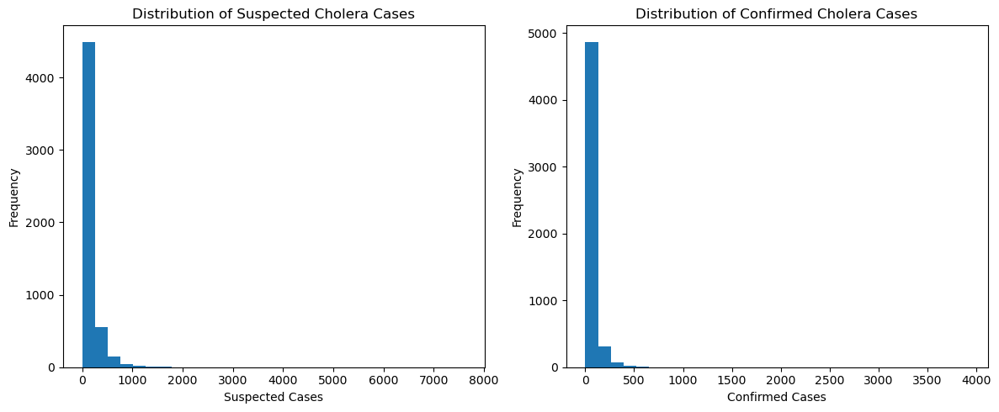

In [17]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))

# Suspected Cases
plt.subplot(1,2,1)
plt.hist(df["sCh"], bins=30)
plt.title("Distribution of Suspected Cholera Cases")
plt.xlabel("Suspected Cases")
plt.ylabel("Frequency")

# Confirmed Cases
plt.subplot(1,2,2)
plt.hist(df["cCh"], bins=30)
plt.title("Distribution of Confirmed Cholera Cases")
plt.xlabel("Confirmed Cases")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

C:\Users\Yangsi\AppData\Local\Temp\ipykernel_25360\2390707740.py:3: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


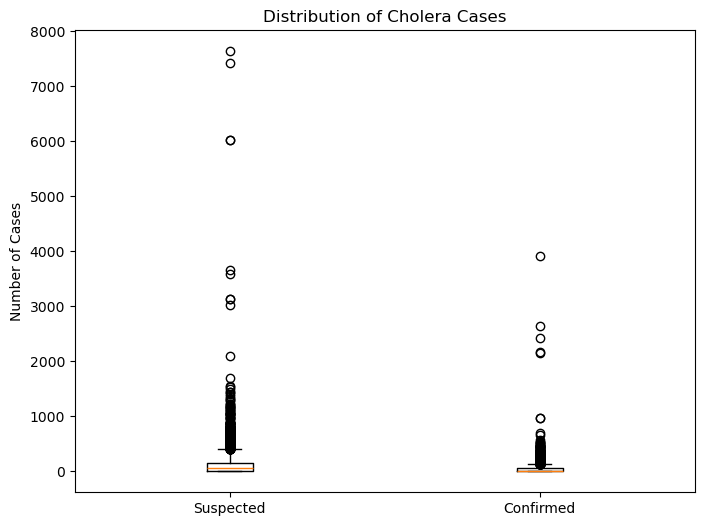

In [18]:
plt.figure(figsize=(8,6))

plt.boxplot(
    [df["sCh"], df["cCh"]],
    labels=["Suspected", "Confirmed"]
)

plt.ylabel("Number of Cases")
plt.title("Distribution of Cholera Cases")

plt.show()

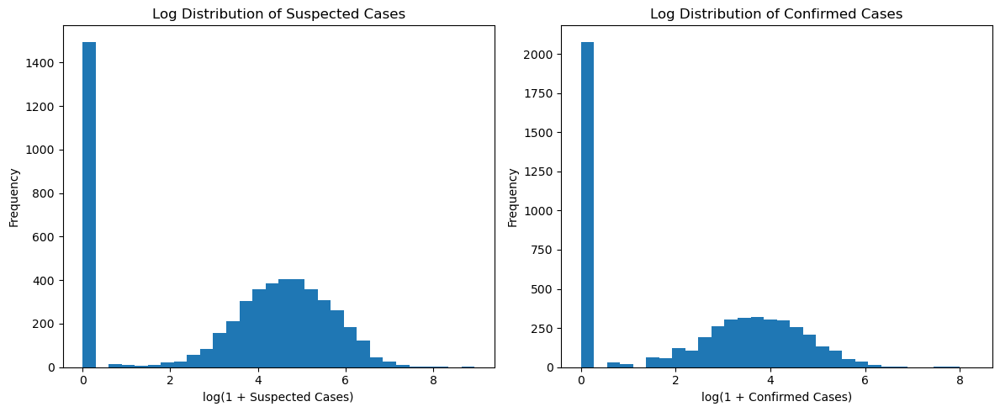

In [19]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(np.log1p(df["sCh"]), bins=30)
plt.title("Log Distribution of Suspected Cases")
plt.xlabel("log(1 + Suspected Cases)")
plt.ylabel("Frequency")

plt.subplot(1,2,2)
plt.hist(np.log1p(df["cCh"]), bins=30)
plt.title("Log Distribution of Confirmed Cases")
plt.xlabel("log(1 + Confirmed Cases)")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

In [20]:
df["cases"] = df["sCh"] + df["cCh"]

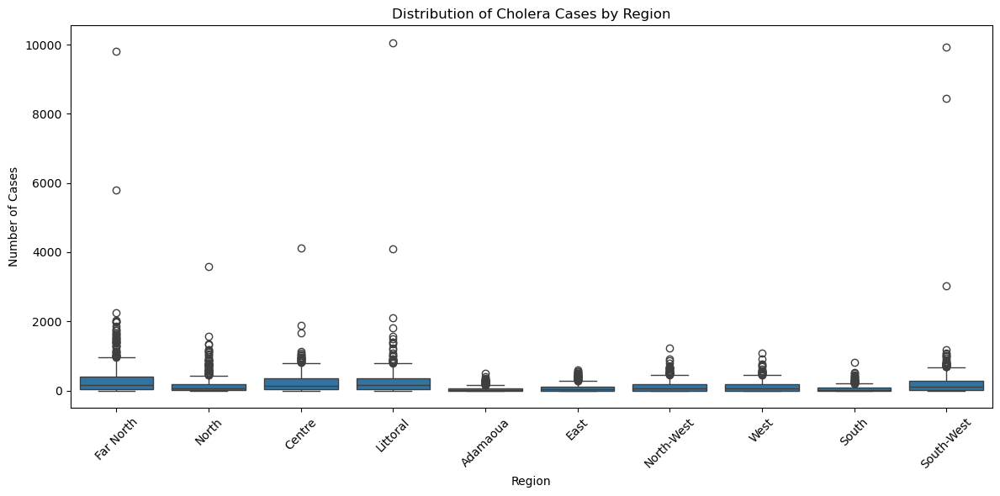

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,6))

sns.boxplot(
    data=df,
    x="Region",
    y="cases"
)

plt.title("Distribution of Cholera Cases by Region")
plt.xlabel("Region")
plt.ylabel("Number of Cases")

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

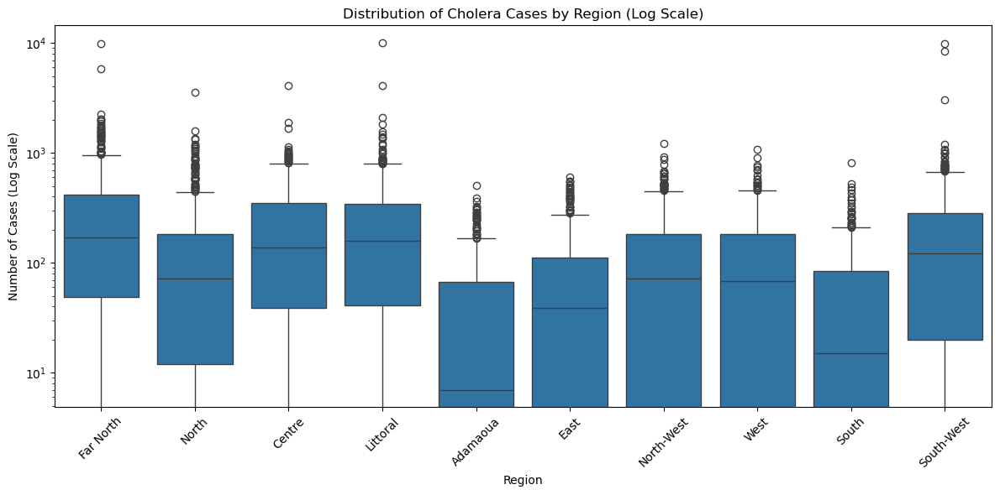

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,6))

sns.boxplot(
    data=df,
    x="Region",
    y="cases"
)

plt.yscale('log')

plt.title("Distribution of Cholera Cases by Region (Log Scale)")
plt.xlabel("Region")
plt.ylabel("Number of Cases (Log Scale)")

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

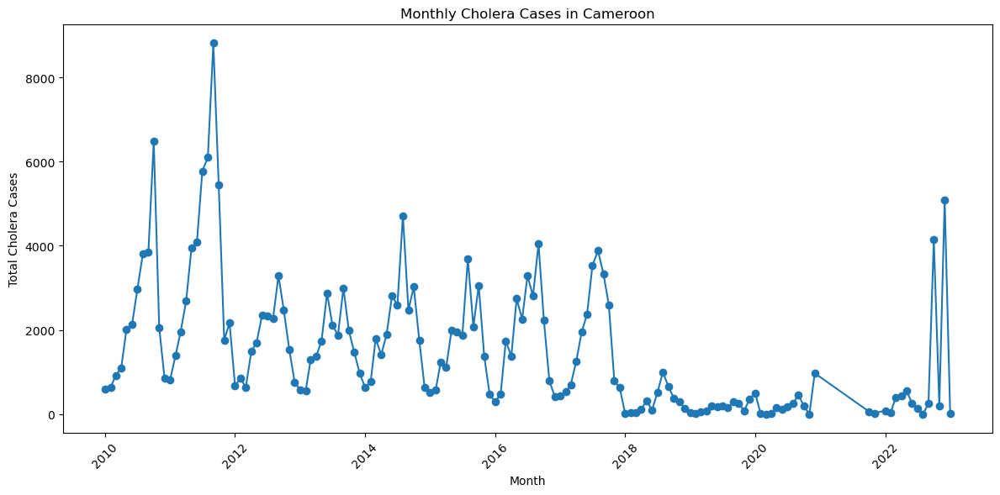

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

df=pd.read_csv("FINAL regional_cholera_environment_dataset.csv")

# Make sure date is datetime
df["reporting_date"] = pd.to_datetime(df["reporting_date"], errors="coerce")

#using total cases to represent overall cholera burden
df["cases"] = df["cCh"]

# Create month column
df["month_date"] = df["reporting_date"].dt.to_period("M").dt.to_timestamp()

# Aggregate cases by month across all regions
monthly_trend = (
    df.groupby("month_date")["cases"]
    .sum()
    .reset_index()
)

# Plot time series
plt.figure(figsize=(12,6))

plt.plot(
    monthly_trend["month_date"],
    monthly_trend["cases"],
    marker="o"
)

plt.title("Monthly Cholera Cases in Cameroon")
plt.xlabel("Month")
plt.ylabel("Total Cholera Cases")

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [105]:
cols = [
    "cCh",
    "sCh",
    "deaths",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg"
]

print(df[cols].corr())

                      cCh       sCh    deaths  rainfall_avg  temperature_avg  \
cCh              1.000000  0.893943  0.857560      0.163103         0.059041   
sCh              0.893943  1.000000  0.810257      0.165795         0.078978   
deaths           0.857560  0.810257  1.000000      0.091359         0.053797   
rainfall_avg     0.163103  0.165795  0.091359      1.000000        -0.259916   
temperature_avg  0.059041  0.078978  0.053797     -0.259916         1.000000   
humidity_avg     0.101856  0.107981  0.055262      0.508414        -0.483778   

                 humidity_avg  
cCh                  0.101856  
sCh                  0.107981  
deaths               0.055262  
rainfall_avg         0.508414  
temperature_avg     -0.483778  
humidity_avg         1.000000  


In [108]:
import statsmodels.api as sm
# Select variables
X = df[[
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg"
]]

y = df["cCh"]

# Remove missing values
data = pd.concat([X, y], axis=1).dropna()

X = data[[
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg"
]]

y = data["cCh"]

# Add intercept
X = sm.add_constant(X)

# Fit model
model = sm.OLS(y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    cCh   R-squared:                       0.043
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     79.00
Date:                Fri, 29 May 2026   Prob (F-statistic):           5.47e-50
Time:                        23:32:22   Log-Likelihood:                -32047.
No. Observations:                5278   AIC:                         6.410e+04
Df Residuals:                    5274   BIC:                         6.413e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -141.9046     17.982     

In [111]:
import pandas as pd

df = pd.read_csv("Master_Dataset.csv")

country_df = df[df["location_parts"] == 1]

print("country-level records:", len(region_df))

country-level records: 1156


In [112]:
country_df.to_csv("country_level_data_1.csv")

In [115]:
df = pd.read_csv("FINAL regional_cholera_environment_dataset.csv")


In [120]:
# Convert reporting_date to datetime
df['reporting_date'] = pd.to_datetime(df['reporting_date'])

agg_dict = {
    'sCh': 'sum',
    'cCh': 'sum',
    'deaths': 'sum'
}

country_df = df.groupby(['reporting_date', 'TL', 'TR'], as_index=False).agg(agg_dict)

country_df['CFR'] = (country_df['deaths'] / country_df['cCh'].replace(0, pd.NA)) * 100

# Add Region column
country_df['Region'] = 'Cameroon'

# Save to CSV
country_df.to_csv("country_level_data_2.csv", index=False)

print(country_df.head())


  reporting_date         TL         TR   sCh  cCh  deaths       CFR    Region
0     2010-01-10   1/4/2010  1/10/2010  1049  256       3  1.171875  Cameroon
1     2010-01-17  1/11/2010  1/17/2010   538  148       0       0.0  Cameroon
2     2010-01-24  1/18/2010  1/24/2010   322  103       0       0.0  Cameroon
3     2010-01-31  1/25/2010  1/31/2010   346   94       1   1.06383  Cameroon
4     2010-02-07   2/1/2010   2/7/2010   633  160       3     1.875  Cameroon


In [125]:
len(df1)


646

In [126]:
len(df2)

722

In [123]:
import pandas as pd

# Load both files
df1 = pd.read_csv("country_level_data_1.csv")
df2 = pd.read_csv("country_level_data_2.csv")
# Keep only the columns you want
cols = ["TL", "TR", "reporting_date", "sCh", "cCh", "CFR"]
df1 = df1[cols]
df2 = df2[cols]

# Concatenate row-wise
combined = pd.concat([df1, df2], ignore_index=True)

# Save to one final file
combined.to_csv("country_level_data_final.csv", index=False)

print("Final file saved as country_level_data_final.csv")
print(combined.head())

Final file saved as country_level_data_final.csv
           TL          TR reporting_date    sCh  cCh   CFR
0  2020-01-01  2020-09-30     2020-09-30      0    0   NaN
1  2018-05-18  2018-11-02     2018-11-02    745   53  7.55
2  2018-05-18  2018-07-05     2018-07-05     26    8  0.00
3  2010-05-06  2010-12-31     2010-12-31  10759    0   NaN
4  2011-01-01  2011-09-22     2011-09-22  17121    0   NaN


In [128]:
import pandas as pd

# Load dataset
df = pd.read_csv("density/WB_WDI_EN_POP_DNST.csv")

# Filter Cameroon records
df_cmr = df[df['REF_AREA'] == 'CMR']

# Keep only important columns
df_cmr = df_cmr[['REF_AREA', 'TIME_PERIOD', 'OBS_VALUE']]

# Rename columns for clarity
df_cmr = df_cmr.rename(columns={
    'TIME_PERIOD': 'Year',
    'OBS_VALUE': 'Population_Density'
})

# Check result
print(df_cmr.head())
print(f"Number of records for Cameroon: {len(df_cmr)}")

# Save cleaned file
df_cmr.to_csv("cmr_DENSITY.csv", index=False)

    REF_AREA  Year  Population_Density
512      CMR  1998           29.922913
716      CMR  2011           42.800668
752      CMR  2012           44.021766
774      CMR  2017           51.043136
831      CMR  1999           30.727380
Number of records for Cameroon: 63


In [130]:
import pandas as pd

df = pd.read_csv("water&sanitation/washdash-download.csv")

df_clean = df[
    (df["ISO3"] == "CMR") &
    (df["Residence Type"] == "total")
][[
    "Year",
    "Service Type",
    "Service level",
    "Coverage"
]]

df_clean.to_csv("cmr_water_sanitation.csv", index=False)

print(df_clean.head())

    Year    Service Type    Service level  Coverage
0   2011  Drinking water   At least basic  57.99071
3   2011      Sanitation   At least basic  34.00940
6   2011  Drinking water  Limited service   9.81510
9   2011      Sanitation  Limited service  17.49131
12  2011      Sanitation  Open defecation   2.41003


In [156]:
import pandas as pd

df = pd.read_csv("FINAL regional_cholera_environment_dataset.csv")
print(df.shape)

(5280, 11)


In [157]:
# 2. Convert date
df["reporting_date"] = pd.to_datetime(df["reporting_date"], errors="coerce")

# 3. Convert case columns to numeric
df["sCh"] = pd.to_numeric(df["sCh"], errors="coerce").fillna(0)
df["cCh"] = pd.to_numeric(df["cCh"], errors="coerce").fillna(0)

# 4. Create total cases
df["cases"] = df["sCh"] + df["cCh"]

# 5. Create month column
df["month_date"] = df["reporting_date"].dt.to_period("M").dt.to_timestamp()

# 6. Aggregate to monthly regional level
monthly = (
    df.groupby(["Region", "month_date"])
    .agg({
        "cases": "sum",
        "rainfall_avg": "mean",
        "temperature_avg": "mean",
        "humidity_avg": "mean"
    })
    .reset_index()
)

# 7. Sort data
monthly = monthly.sort_values(["Region", "month_date"])

# 8. Check result
print(monthly.head(20))
print(monthly.shape)
print(monthly["cases"].describe())
print(monthly["Region"].nunique())

      Region month_date  cases  rainfall_avg  temperature_avg  humidity_avg
0   Adamaoua 2010-01-01     19      0.028214        22.468571     40.163929
1   Adamaoua 2010-02-01     47      0.039643        24.665000     43.458214
2   Adamaoua 2010-03-01    154      1.157500        25.286429     47.182500
3   Adamaoua 2010-04-01    378      3.931429        25.590357     63.309286
4   Adamaoua 2010-05-01     86      4.798286        24.232857     77.565714
5   Adamaoua 2010-06-01    126      6.778571        23.131071     79.708214
6   Adamaoua 2010-07-01    479      8.108214        21.512857     85.185000
7   Adamaoua 2010-08-01    204     11.916857        21.222857     86.643714
8   Adamaoua 2010-09-01    120      5.096786        21.299643     86.566071
9   Adamaoua 2010-10-01     62      5.518571        21.852571     84.123429
10  Adamaoua 2010-11-01    128      1.096786        22.248214     73.478929
11  Adamaoua 2010-12-01     82      1.099260        21.084288     58.553569
12  Adamaoua

In [158]:
print("Total rows:", len(monthly))

print("Zero case rows:",
      (monthly["cases"] == 0).sum())

print("Percent zeros:",
      round(
          (monthly["cases"] == 0).mean() * 100,
          2
      ),
      "%"
)

Total rows: 1237
Zero case rows: 115
Percent zeros: 9.3 %


In [159]:
monthly = monthly.sort_values(
    ["Region", "month_date"]
)

monthly["cases_lag1"] = (
    monthly.groupby("Region")["cases"]
    .shift(1)
)

monthly["cases_lag2"] = (
    monthly.groupby("Region")["cases"]
    .shift(2)
)

monthly["cases_lag3"] = (
    monthly.groupby("Region")["cases"]
    .shift(3)
)

In [160]:
monthly["future_cases"] = (
    monthly.groupby("Region")["cases"]
    .shift(-1)
)

In [161]:
monthly = monthly.dropna()

In [162]:
print(
    monthly[
        [
            "Region",
            "month_date",
            "cases",
            "cases_lag1",
            "cases_lag2",
            "cases_lag3",
            "future_cases"
        ]
    ].head(20)
)

      Region month_date  cases  cases_lag1  cases_lag2  cases_lag3  \
3   Adamaoua 2010-04-01    378       154.0        47.0        19.0   
4   Adamaoua 2010-05-01     86       378.0       154.0        47.0   
5   Adamaoua 2010-06-01    126        86.0       378.0       154.0   
6   Adamaoua 2010-07-01    479       126.0        86.0       378.0   
7   Adamaoua 2010-08-01    204       479.0       126.0        86.0   
8   Adamaoua 2010-09-01    120       204.0       479.0       126.0   
9   Adamaoua 2010-10-01     62       120.0       204.0       479.0   
10  Adamaoua 2010-11-01    128        62.0       120.0       204.0   
11  Adamaoua 2010-12-01     82       128.0        62.0       120.0   
12  Adamaoua 2011-01-01    161        82.0       128.0        62.0   
13  Adamaoua 2011-02-01      0       161.0        82.0       128.0   
14  Adamaoua 2011-03-01     75         0.0       161.0        82.0   
15  Adamaoua 2011-04-01    209        75.0         0.0       161.0   
16  Adamaoua 2011-05

In [163]:
print(
    monthly[
        [
            "cases",
            "cases_lag1",
            "cases_lag2",
            "cases_lag3",
            "future_cases"
        ]
    ].corr()
)

                 cases  cases_lag1  cases_lag2  cases_lag3  future_cases
cases         1.000000    0.636567    0.499112    0.333249      0.630380
cases_lag1    0.636567    1.000000    0.683901    0.536751      0.486954
cases_lag2    0.499112    0.683901    1.000000    0.683372      0.324626
cases_lag3    0.333249    0.536751    0.683372    1.000000      0.200832
future_cases  0.630380    0.486954    0.324626    0.200832      1.000000


In [164]:
import numpy as np

monthly["future_cases_log"] = np.log1p(
    monthly["future_cases"]
)

print(
    monthly["future_cases_log"].describe()
)

count    1197.000000
mean        5.482958
std         2.133782
min         0.000000
25%         4.867534
50%         6.033086
75%         6.824374
max         9.627602
Name: future_cases_log, dtype: float64


In [165]:
print(monthly["future_cases"].describe())
print(monthly["future_cases_log"].describe())

count     1197.000000
mean       742.304929
std       1143.431341
min          0.000000
25%        129.000000
50%        416.000000
75%        919.000000
max      15177.000000
Name: future_cases, dtype: float64
count    1197.000000
mean        5.482958
std         2.133782
min         0.000000
25%         4.867534
50%         6.033086
75%         6.824374
max         9.627602
Name: future_cases_log, dtype: float64


In [166]:
features = [
    "cases",
    "cases_lag1",
    "cases_lag2",
    "cases_lag3",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "month",
    "Region_enc"
]

In [167]:
import numpy as np

monthly["future_cases_log"] = np.log1p(
    monthly["future_cases"]
)

y = monthly["future_cases_log"]

In [173]:
print(monthly.shape)
print(df.shape)

(1197, 11)
(5280, 13)


In [174]:
train = monthly[
    monthly["month_date"] < "2021-01-01"
]

test = monthly[
    monthly["month_date"] >= "2021-01-01"
]

print(train.shape)
print(test.shape)

print(train["month_date"].min())
print(train["month_date"].max())

print(test["month_date"].min())
print(test["month_date"].max())

(1146, 11)
(51, 11)
2010-04-01 00:00:00
2020-12-01 00:00:00
2021-10-01 00:00:00
2022-12-01 00:00:00


In [175]:
monthly[
    (monthly["month_date"] >= "2021-01-01") &
    (monthly["month_date"] < "2021-10-01")
].shape

(0, 11)

In [176]:
monthly[
    (monthly["month_date"] >= "2021-01-01") &
    (monthly["month_date"] < "2021-10-01")
][["Region","month_date"]].head(20)

,Region,month_date


In [177]:
features = [
    "cases",
    "cases_lag1",
    "cases_lag2",
    "cases_lag3",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg"
]

print(
    monthly[
        features + ["future_cases"]
    ].corr()["future_cases"]
    .sort_values(ascending=False)
)

future_cases       1.000000
cases              0.630380
cases_lag1         0.486954
cases_lag2         0.324626
rainfall_avg       0.240813
cases_lag3         0.200832
temperature_avg    0.150885
humidity_avg       0.120197
Name: future_cases, dtype: float64


In [178]:
q1 = monthly["future_cases"].quantile(0.33)
q2 = monthly["future_cases"].quantile(0.66)

print(q1, q2)

208.04000000000002 696.08


In [179]:
def risk_label(x):

    if x <= q1:
        return 0   # Low

    elif x <= q2:
        return 1   # Medium

    return 2       # High

monthly["future_risk"] = (
    monthly["future_cases"]
    .apply(risk_label)
)

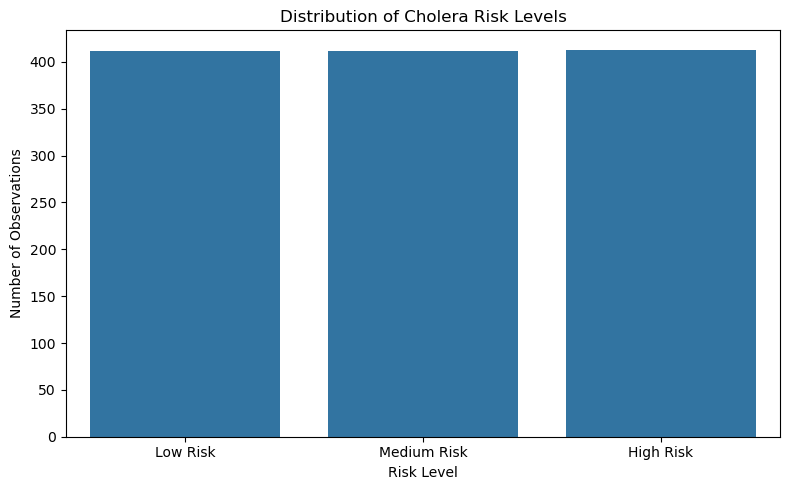

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,5))

sns.countplot(
    x="risk_level",
    data=monthly,
    order=[0,1,2]
)

plt.title("Distribution of Cholera Risk Levels")
plt.xlabel("Risk Level")
plt.ylabel("Number of Observations")

plt.xticks(
    [0,1,2],
    ["Low Risk", "Medium Risk", "High Risk"]
)

plt.tight_layout()
plt.savefig("risk_level_distribution.png", dpi=300)
plt.show()

Correlation with risk_level:
risk_level          1.000000
cases_lag1          0.453008
cases_lag2          0.396538
rainfall_avg        0.382997
deaths              0.377711
rainfall_lag1       0.327362
humidity_avg        0.244676
month               0.197665
rainfall_lag2       0.196159
temperature_lag2    0.180180
humidity_lag1       0.172076
temperature_lag1    0.146391
temperature_avg     0.096557
humidity_lag2       0.073255
year               -0.329587
Name: risk_level, dtype: float64


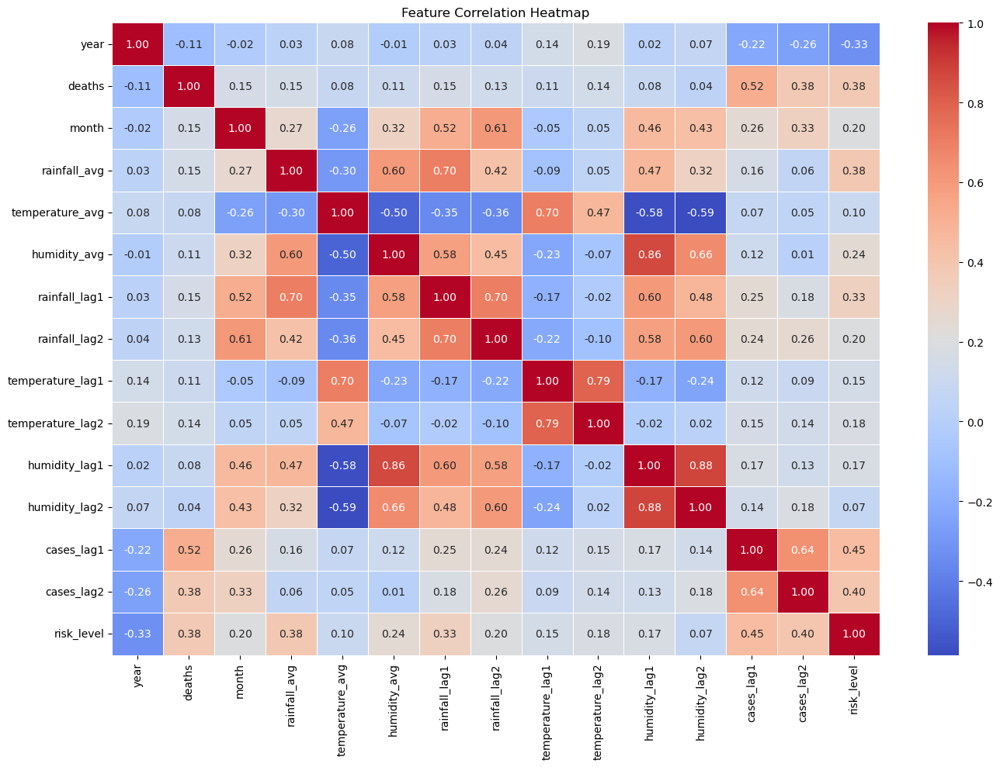

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#features to inspect
features = [
    "year",
    "deaths",
    "month",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "rainfall_lag1",
    "rainfall_lag2",
    "temperature_lag1",
    "temperature_lag2",
    "humidity_lag1",
    "humidity_lag2",
    "cases_lag1",
    "cases_lag2",
    "risk_level"
]

# Select only available columns
corr_data = monthly[features].copy()

# Convert everything to numeric
for col in corr_data.columns:
    corr_data[col] = pd.to_numeric(corr_data[col], errors="coerce")

# Correlation matrix
corr_matrix = corr_data.corr()

# Show correlation with target only
target_corr = corr_matrix["risk_level"].sort_values(ascending=False)

print("Correlation with risk_level:")
print(target_corr)

# Heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    linewidths=0.5
)

plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()

In [ ]:
#ML TRAINING STARTS HERE

In [21]:
import pandas as pd
import numpy as np

# Load dataset
df = pd.read_csv("FINAL regional_cholera_environment_dataset.csv")
df2 = pd.read_csv("regional_non_phantom_cholera_environment_dataset.csv")

slope = pd.read_csv("cameroon_region_stats_complete1.csv")

In [22]:
#  Convert date columns
date_cols = ["reporting_date", "TL", "TR"]

for col in date_cols:
    df[col] = pd.to_datetime(df[col], errors="coerce")
    df2[col] = pd.to_datetime(df[col], errors="coerce")


# . Convert numeric columns
numeric_cols = [
    "sCh", "cCh", "deaths", "CFR",
    "rainfall_avg", "temperature_avg", "humidity_avg"
]

for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors="coerce").fillna(0)
    df2[col] = pd.to_numeric(df[col], errors="coerce").fillna(0)


# Create total cholera cases
df["cases"] = df["sCh"] + df["cCh"]
df2["cases"] = df["sCh"] + df["cCh"]

In [30]:
#  Create month column with phantom
df["month_date"] = df["reporting_date"].dt.to_period("M").dt.to_timestamp()
df2["month_date"] = df["reporting_date"].dt.to_period("M").dt.to_timestamp()


#  Aggregate to monthly regional level
monthly = (
    df.groupby(["Region", "month_date"])
    .agg({
        "cases": "sum",
        "deaths": "sum",
        "CFR": "mean",
        "rainfall_avg": "mean",
        "temperature_avg": "mean",
        "humidity_avg": "mean"
    })
    .reset_index()
)
slope = pd.read_csv("cameroon_region_stats_complete1.csv")
slope["adm1_name"] = slope["adm1_name"].str.replace("-", " ")

# Merge into monthly dataset
monthly = monthly.merge(
    slope[["adm1_name","elevation_mean","slope_mean_x","slope_mean_y"]],
    left_on="Region",
    right_on="adm1_name",
    how="left"
)

monthly = monthly.drop(columns=["adm1_name"])

In [11]:
#  Create month column without phantom
df["month_date"] = df["reporting_date"].dt.to_period("M").dt.to_timestamp()
df2["month_date"] = df["reporting_date"].dt.to_period("M").dt.to_timestamp()


#  Aggregate to monthly regional level
monthly = (
    df2.groupby(["Region", "month_date"])
    .agg({
        "cases": "sum",
        "deaths": "sum",
        "CFR": "mean",
        "rainfall_avg": "mean",
        "temperature_avg": "mean",
        "humidity_avg": "mean"
    })
    .reset_index()
)

In [31]:
# Create future cases target
monthly["future_cases"] = monthly.groupby("Region")["cases"].shift(-1)

monthly = monthly.dropna(subset=["future_cases"])

# Fill missing lag values after dropping future NaNs
monthly = monthly.fillna(0)

In [54]:
# Create future risk level target 2 classes (Low=0, High=1)
monthly["risk_level"] = pd.qcut(
    monthly["future_cases"],
    q=2,
    labels=[0, 1]
).astype(int)

print("Risk level distribution:")
print(monthly["risk_level"].value_counts().sort_index())

print("\nFuture case threshold:")
print(monthly["future_cases"].quantile([0.5]))

Risk level distribution:
risk_level
0    616
1    616
Name: count, dtype: int64

Future case threshold:
0.5    403.0
Name: future_cases, dtype: float64


In [32]:
# Create future risk level target 3 classes
monthly["risk_level"] = pd.qcut(
    monthly["future_cases"],
    q=3,
    labels=[0, 1, 2]
).astype(int)

print("Risk level distribution:")
print(monthly["risk_level"].value_counts().sort_index())

print("\nFuture case thresholds:")
print(monthly["future_cases"].quantile([0.33, 0.66]))

Risk level distribution:
risk_level
0    409
1    410
2    408
Name: count, dtype: int64

Future case thresholds:
0.33    210.16
0.66    690.16
Name: future_cases, dtype: float64


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import numpy as np
import pandas as pd

monthly["year"] = monthly["month_date"].dt.year
monthly["month"] = monthly["month_date"].dt.month

# Cyclical month encoding
monthly["month_sin"] = np.sin(2*np.pi * monthly["month"]/12)
monthly["month_cos"] = np.cos(2*np.pi * monthly["month"]/12)

df = pd.read_csv("regional_non_phantom_cholera_environment_dataset")

# Baseline features
baseline_features = [
    "cases",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "month",
    "Region",
    "deaths"
]

X_base = monthly[baseline_features]
y = monthly["risk_level"]

# One-hot encode region
X_base = pd.get_dummies(
    X_base,
    columns=["Region"],
    prefix="Region_"
)

# Logistic Regression model with scaling
model = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        max_iter=10000,
        solver="lbfgs"
    )
)

# Time series cross validation
tscv = TimeSeriesSplit(n_splits=5)

summary = []

accuracies = []
f1_macros = []

precisions = {
    "Low": [],
    "Medium": [],
    "High": []
}

recalls = {
    "Low": [],
    "Medium": [],
    "High": []
}


# Cross-validation loop
for train_idx, test_idx in tscv.split(X_base):

    X_train = X_base.iloc[train_idx]
    X_test = X_base.iloc[test_idx]

    y_train = y.iloc[train_idx]
    y_test = y.iloc[test_idx]

    # Train model
    model.fit(X_train, y_train)

    # Predict
    y_pred = model.predict(X_test)

    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Classification report
    report = classification_report(
        y_test,
        y_pred,
        target_names=["Low", "Medium", "High"],
        output_dict=True,
        zero_division=0
    )

    # Macro F1-score
    f1_macros.append(
        report["macro avg"]["f1-score"]
    )

    # Class-specific precision and recall
    for cls in ["Low", "Medium", "High"]:
        precisions[cls].append(
            report[cls]["precision"]
        )

        recalls[cls].append(
            report[cls]["recall"]
        )


# Store averaged results
summary.append({

    "Model": "Logistic Regression",

    "Accuracy": float(np.mean(accuracies)),

    "Macro F1": float(np.mean(f1_macros)),

    "Low Precision": float(np.mean(precisions["Low"])),
    "Low Recall": float(np.mean(recalls["Low"])),

    "Medium Precision": float(np.mean(precisions["Medium"])),
    "Medium Recall": float(np.mean(recalls["Medium"])),

    "High Precision": float(np.mean(precisions["High"])),
    "High Recall": float(np.mean(recalls["High"]))

})


# Convert results into dataframe
df_summary = pd.DataFrame(summary)

# Display results
print(df_summary.round(4))

In [56]:
# without phantom
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import numpy as np
import pandas as pd

monthly["year"] = monthly["month_date"].dt.year
monthly["month"] = monthly["month_date"].dt.month

# Cyclical month encoding
monthly["month_sin"] = np.sin(2*np.pi * monthly["month"]/12)
monthly["month_cos"] = np.cos(2*np.pi * monthly["month"]/12)

# Baseline features
baseline_features = [
    "cases",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "month",
    "Region",
    "deaths"
]

X_base = monthly[baseline_features]
y = monthly["risk_level"]

# One-hot encode region
X_base = pd.get_dummies(
    X_base,
    columns=["Region"],
    prefix="Region_"
)

# Logistic Regression model with scaling
model = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        max_iter=10000,
        solver="lbfgs"
    )
)

# Time series cross validation
tscv = TimeSeriesSplit(n_splits=5)

summary = []

accuracies = []
f1_macros = []

precisions = {
    "Low": [],
    "Medium": [],
    "High": []
}

recalls = {
    "Low": [],
    "Medium": [],
    "High": []
}


# Cross-validation loop
for train_idx, test_idx in tscv.split(X_base):

    X_train = X_base.iloc[train_idx]
    X_test = X_base.iloc[test_idx]

    y_train = y.iloc[train_idx]
    y_test = y.iloc[test_idx]

    # Train model
    model.fit(X_train, y_train)

    # Predict
    y_pred = model.predict(X_test)

    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Classification report
    report = classification_report(
        y_test,
        y_pred,
        target_names=["Low", "Medium", "High"],
        output_dict=True,
        zero_division=0
    )

    # Macro F1-score
    f1_macros.append(
        report["macro avg"]["f1-score"]
    )

    # Class-specific precision and recall
    for cls in ["Low", "Medium", "High"]:
        precisions[cls].append(
            report[cls]["precision"]
        )

        recalls[cls].append(
            report[cls]["recall"]
        )


# Store averaged results
summary.append({

    "Model": "Logistic Regression",

    "Accuracy": float(np.mean(accuracies)),

    "Macro F1": float(np.mean(f1_macros)),

    "Low Precision": float(np.mean(precisions["Low"])),
    "Low Recall": float(np.mean(recalls["Low"])),

    "Medium Precision": float(np.mean(precisions["Medium"])),
    "Medium Recall": float(np.mean(recalls["Medium"])),

    "High Precision": float(np.mean(precisions["High"])),
    "High Recall": float(np.mean(recalls["High"]))

})


# Convert results into dataframe
df_summary = pd.DataFrame(summary)

# Display results
print(df_summary.round(4))

                 Model  Accuracy  Macro F1  Low Precision  Low Recall  \
0  Logistic Regression     0.562     0.531         0.6184      0.5887   

   Medium Precision  Medium Recall  High Precision  High Recall  
0            0.4832         0.3827          0.5887       0.6828  


In [39]:
#class specifics 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import numpy as np
import pandas as pd

monthly["year"] = monthly["month_date"].dt.year
monthly["month"] = monthly["month_date"].dt.month

# Cyclical month encoding
monthly["month_sin"] = np.sin(2*np.pi * monthly["month"]/12)
monthly["month_cos"] = np.cos(2*np.pi * monthly["month"]/12)

df = pd.read_csv("FINAL regional_cholera_environment_dataset.csv")

# Baseline features
baseline_features = [
    "cases",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "month",
    "Region",
    "deaths"
]

X_base = monthly[baseline_features]
y = monthly["risk_level"]

# One-hot encode region
X_base = pd.get_dummies(
    X_base,
    columns=["Region"],
    prefix="Region_"
)

# Logistic Regression model with scaling
model = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        max_iter=10000,
        solver="lbfgs"
    )
)

# Time series cross validation
tscv = TimeSeriesSplit(n_splits=5)

summary = []

accuracies = []
f1_macros = []

precisions = {
    "Low": [],
    "Medium": [],
    "High": []
}

recalls = {
    "Low": [],
    "Medium": [],
    "High": []
}


# Cross-validation loop
for train_idx, test_idx in tscv.split(X_base):

    X_train = X_base.iloc[train_idx]
    X_test = X_base.iloc[test_idx]

    y_train = y.iloc[train_idx]
    y_test = y.iloc[test_idx]

    # Train model
    model.fit(X_train, y_train)

    # Predict
    y_pred = model.predict(X_test)

    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    # Classification report
    report = classification_report(
        y_test,
        y_pred,
        target_names=["Low", "Medium", "High"],
        output_dict=True,
        zero_division=0
    )

    # Macro F1-score
    f1_macros.append(
        report["macro avg"]["f1-score"]
    )

    # Class-specific precision and recall
    for cls in ["Low", "Medium", "High"]:
        precisions[cls].append(
            report[cls]["precision"]
        )

        recalls[cls].append(
            report[cls]["recall"]
        )


# Store averaged results
summary.append({

    "Model": "Logistic Regression",

    "Accuracy": float(np.mean(accuracies)),

    "Macro F1": float(np.mean(f1_macros)),

    "Low Precision": float(np.mean(precisions["Low"])),
    "Low Recall": float(np.mean(recalls["Low"])),

    "Medium Precision": float(np.mean(precisions["Medium"])),
    "Medium Recall": float(np.mean(recalls["Medium"])),

    "High Precision": float(np.mean(precisions["High"])),
    "High Recall": float(np.mean(recalls["High"]))

})


# Convert results into dataframe
df_summary = pd.DataFrame(summary)

# Display results
print(df_summary.round(4))

                 Model  Accuracy  Macro F1  Low Precision  Low Recall  \
0  Logistic Regression    0.5578    0.5198         0.7008      0.4388   

   Medium Precision  Medium Recall  High Precision  High Recall  
0            0.4522         0.5735          0.6403       0.6018  


In [33]:
#with phantom and slope elevation
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import numpy as np
import pandas as pd


# DATA PREPARATION

monthly["year"] = monthly["month_date"].dt.year
monthly["month"] = monthly["month_date"].dt.month

# Cyclical month encoding
monthly["month_sin"] = np.sin(
    2*np.pi * monthly["month"]/12
)

monthly["month_cos"] = np.cos(
    2*np.pi * monthly["month"]/12
)


# BASELINE FEATURES

baseline_features = [
    "cases",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "month",
    "Region",
    "deaths",
    "elevation_mean",
    "slope_mean_x",
    "slope_mean_y"
]



X_base = monthly[baseline_features].copy()

y = monthly["risk_level"]


# One-hot encode region
X_base = pd.get_dummies(
    X_base,
    columns=["Region"],
    prefix="Region_"
)


# HOLDOUT SPLIT (30%)

holdout_size = int(len(X_base) * 0.20)

X_hold = X_base.iloc[-holdout_size:]
y_hold = y.iloc[-holdout_size:]


X_rest = X_base.iloc[:-holdout_size]
y_rest = y.iloc[:-holdout_size]


# LOGISTIC REGRESSION MODEL

model = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        max_iter=10000,
        solver="lbfgs"
    )
)


# TIME SERIES CROSS VALIDATION

tscv = TimeSeriesSplit(
    n_splits=5
)


cv_accuracy = []
cv_precision = []
cv_recall = []
cv_f1 = []


# CROSS VALIDATION

for train_idx, test_idx in tscv.split(X_rest):

    X_train = X_rest.iloc[train_idx]
    X_test = X_rest.iloc[test_idx]

    y_train = y_rest.iloc[train_idx]
    y_test = y_rest.iloc[test_idx]


    # Train model
    model.fit(
        X_train,
        y_train
    )


    # Predict
    y_pred = model.predict(
        X_test
    )


    # Metrics
    cv_accuracy.append(
        accuracy_score(
            y_test,
            y_pred
        )
    )


    cv_precision.append(
        precision_score(
            y_test,
            y_pred,
            average="macro",
            zero_division=0
        )
    )


    cv_recall.append(
        recall_score(
            y_test,
            y_pred,
            average="macro",
            zero_division=0
        )
    )


    cv_f1.append(
        f1_score(
            y_test,
            y_pred,
            average="macro"
        )
    )


# FINAL TRAINING

model.fit(
    X_rest,
    y_rest
)


# HOLDOUT EVALUATION

y_hold_pred = model.predict(
    X_hold
)


hold_accuracy = accuracy_score(
    y_hold,
    y_hold_pred
)


hold_precision = precision_score(
    y_hold,
    y_hold_pred,
    average="macro",
    zero_division=0
)


hold_recall = recall_score(
    y_hold,
    y_hold_pred,
    average="macro",
    zero_division=0
)


hold_f1 = f1_score(
    y_hold,
    y_hold_pred,
    average="macro"
)



summary = pd.DataFrame([{

    "Model": "Logistic Regression",

    "CV Accuracy":
        np.mean(cv_accuracy),

    "CV Precision":
        np.mean(cv_precision),

    "CV Recall":
        np.mean(cv_recall),

    "CV F1 (macro)":
        np.mean(cv_f1),


    "Hold-out Accuracy":
        hold_accuracy,

    "Hold-out Precision":
        hold_precision,

    "Hold-out Recall":
        hold_recall,

    "Hold-out F1 (macro)":
        hold_f1

}])


print("\nLogistic Regression Results:")
print(summary.round(4))


# Save results
summary.to_csv(
    "logistic_regression_results.csv",
    index=False
)

print("Results saved: logistic_regression_results.csv")


Logistic Regression Results:
                 Model  CV Accuracy  CV Precision  CV Recall  CV F1 (macro)  \
0  Logistic Regression       0.5387        0.4902     0.5114         0.4809   

   Hold-out Accuracy  Hold-out Precision  Hold-out Recall  Hold-out F1 (macro)  
0             0.5388              0.5432           0.5374               0.5363  
Results saved: logistic_regression_results.csv


In [42]:
#with phantom
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import numpy as np
import pandas as pd


# DATA PREPARATION

monthly["year"] = monthly["month_date"].dt.year
monthly["month"] = monthly["month_date"].dt.month

# Cyclical month encoding
monthly["month_sin"] = np.sin(
    2*np.pi * monthly["month"]/12
)

monthly["month_cos"] = np.cos(
    2*np.pi * monthly["month"]/12
)


# BASELINE FEATURES

baseline_features = [
    "cases",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "month",
    "Region",
    "deaths"
]


X_base = monthly[baseline_features].copy()

y = monthly["risk_level"]


# One-hot encode region
X_base = pd.get_dummies(
    X_base,
    columns=["Region"],
    prefix="Region_"
)


# HOLDOUT SPLIT (30%)

holdout_size = int(len(X_base) * 0.20)

X_hold = X_base.iloc[-holdout_size:]
y_hold = y.iloc[-holdout_size:]


X_rest = X_base.iloc[:-holdout_size]
y_rest = y.iloc[:-holdout_size]


# LOGISTIC REGRESSION MODEL

model = make_pipeline(
    StandardScaler(),
    LogisticRegression(
        max_iter=10000,
        solver="lbfgs"
    )
)


# TIME SERIES CROSS VALIDATION

tscv = TimeSeriesSplit(
    n_splits=5
)


cv_accuracy = []
cv_precision = []
cv_recall = []
cv_f1 = []


# CROSS VALIDATION

for train_idx, test_idx in tscv.split(X_rest):

    X_train = X_rest.iloc[train_idx]
    X_test = X_rest.iloc[test_idx]

    y_train = y_rest.iloc[train_idx]
    y_test = y_rest.iloc[test_idx]


    # Train model
    model.fit(
        X_train,
        y_train
    )


    # Predict
    y_pred = model.predict(
        X_test
    )


    # Metrics
    cv_accuracy.append(
        accuracy_score(
            y_test,
            y_pred
        )
    )


    cv_precision.append(
        precision_score(
            y_test,
            y_pred,
            average="macro",
            zero_division=0
        )
    )


    cv_recall.append(
        recall_score(
            y_test,
            y_pred,
            average="macro",
            zero_division=0
        )
    )


    cv_f1.append(
        f1_score(
            y_test,
            y_pred,
            average="macro"
        )
    )


# FINAL TRAINING

model.fit(
    X_rest,
    y_rest
)


# HOLDOUT EVALUATION

y_hold_pred = model.predict(
    X_hold
)


hold_accuracy = accuracy_score(
    y_hold,
    y_hold_pred
)


hold_precision = precision_score(
    y_hold,
    y_hold_pred,
    average="macro",
    zero_division=0
)


hold_recall = recall_score(
    y_hold,
    y_hold_pred,
    average="macro",
    zero_division=0
)


hold_f1 = f1_score(
    y_hold,
    y_hold_pred,
    average="macro"
)



summary = pd.DataFrame([{

    "Model": "Logistic Regression",

    "CV Accuracy":
        np.mean(cv_accuracy),

    "CV Precision":
        np.mean(cv_precision),

    "CV Recall":
        np.mean(cv_recall),

    "CV F1 (macro)":
        np.mean(cv_f1),


    "Hold-out Accuracy":
        hold_accuracy,

    "Hold-out Precision":
        hold_precision,

    "Hold-out Recall":
        hold_recall,

    "Hold-out F1 (macro)":
        hold_f1

}])


print("\nLogistic Regression Results:")
print(summary.round(4))


# Save results
summary.to_csv(
    "logistic_regression_results.csv",
    index=False
)

print("Results saved: logistic_regression_results.csv")


Logistic Regression Results:
                 Model  CV Accuracy  CV Precision  CV Recall  CV F1 (macro)  \
0  Logistic Regression       0.5767        0.5205     0.5459         0.5176   

   Hold-out Accuracy  Hold-out Precision  Hold-out Recall  Hold-out F1 (macro)  
0             0.5755              0.6161           0.5859               0.5746  
Results saved: logistic_regression_results.csv


In [12]:
# feature importance
model.fit(X_base, y)

# Extract coefficients from Logistic Regression
log_reg = model.named_steps["logisticregression"]
scaler = model.named_steps["standardscaler"]

# Get feature names (after one-hot encoding)
feature_names = X_base.columns

# Coefficients
coefficients = log_reg.coef_[0]  # For multiclass, you can inspect each row

# Create DataFrame for feature importance
importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefficients
}).sort_values(by="Coefficient", ascending=False)

print(importance_df)


               Feature  Coefficient
5               deaths     1.778609
4                month     0.434782
6     Region__Adamaoua     0.211704
13       Region__South     0.185715
8         Region__East     0.029729
14  Region__South-West     0.021264
10    Region__Littoral     0.005264
15        Region__West    -0.001814
7       Region__Centre    -0.020269
12  Region__North-West    -0.039351
11       Region__North    -0.144546
2      temperature_avg    -0.190456
9    Region__Far North    -0.238956
3         humidity_avg    -0.273073
1         rainfall_avg    -0.387066
0                cases    -3.342255


In [13]:
#coeficient vs permutation importance
from sklearn.inspection import permutation_importance

# Fit the model once on the full dataset
model.fit(X_base, y)

# Coefficient-based importance (multiclass)
logreg = model.named_steps["logisticregression"]

# coef_ shape = (n_classes, n_features)
coef_matrix = logreg.coef_
feature_names = X_base.columns.tolist()

# Build DataFrame with one column per class
coef_importance = pd.DataFrame(
    coef_matrix.T,
    index=feature_names,
    columns=[f"Class_{i}" for i in range(coef_matrix.shape[0])]
)

# Add mean absolute importance across classes for ranking
coef_importance["MeanAbsImportance"] = coef_importance.abs().mean(axis=1)

# Deduplicate by grouping on feature name (in case of repeated dummy columns)
coef_importance = (
    coef_importance.groupby(coef_importance.index)
    .mean()
    .sort_values("MeanAbsImportance", ascending=False)
)

print("\nCoefficient-based importance (all classes):")
print(coef_importance)

# Permutation importance ---
perm_importance = permutation_importance(
    model, X_base, y, n_repeats=10, random_state=42
)

perm_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": perm_importance.importances_mean
})

# Deduplicate by grouping
perm_df = (
    perm_df.groupby("Feature")
    .mean()
    .sort_values("Importance", ascending=False)
)

print("\nPermutation importance:")
print(perm_df)



Coefficient-based importance (all classes):
                     Class_0   Class_1   Class_2  MeanAbsImportance
cases              -3.342255  0.648555  2.693700           2.228170
deaths              1.778609 -0.436700 -1.341909           1.185739
month               0.434782  0.079171 -0.513952           0.342635
humidity_avg       -0.273073 -0.168417  0.441489           0.294326
rainfall_avg       -0.387066 -0.011260  0.398326           0.265551
Region__Adamaoua    0.211704  0.155917 -0.367622           0.245081
Region__South       0.185715  0.132745 -0.318460           0.212307
temperature_avg    -0.190456 -0.111306  0.301762           0.201175
Region__Far North  -0.238956 -0.032706  0.271662           0.181108
Region__Centre     -0.020269 -0.128097  0.148366           0.098910
Region__North      -0.144546  0.028231  0.116315           0.096364
Region__North-West -0.039351 -0.083552  0.122903           0.081935
Region__East        0.029729  0.053227 -0.082956           0.055304
Reg

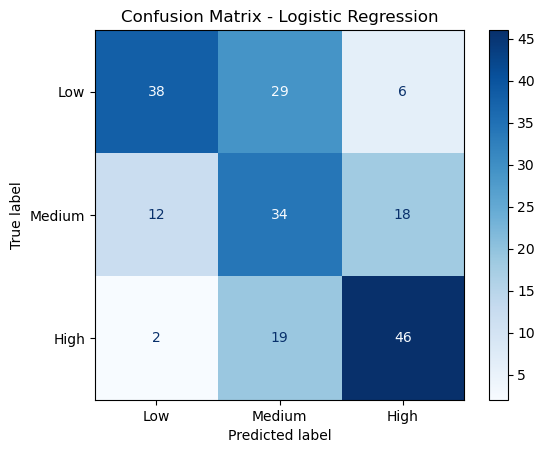

In [14]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Low","Medium","High"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Logistic Regression")
plt.show()


In [21]:

#  Sort data
monthly = monthly.sort_values(["Region", "month_date"])

# Create time features
monthly["year"] = monthly["month_date"].dt.year
monthly["month"] = monthly["month_date"].dt.month
monthly["month_sin"] = np.sin(2*np.pi * monthly["month"]/12)
monthly["month_cos"] = np.cos(2*np.pi * monthly["month"]/12)

# Create lag features
monthly["cases_lag1"] = monthly.groupby("Region")["cases"].shift(1)
monthly["cases_lag2"] = monthly.groupby("Region")["cases"].shift(2)

# Log-transform the lag features (add +1 to avoid log(0))
monthly["log_cases_lag1"] = np.log1p(monthly["cases_lag1"])
monthly["log_cases_lag2"] = np.log1p(monthly["cases_lag2"])
monthly["log_cases"] = np.log1p(monthly["cases"])



#monthly["cases_pct_change_1m"]=monthly["cases"].pct_change(periods=1)
#monthly["cases_rolling_mean_3m"]=monthly["cases"].rolling(window=3, min_periods=1).mean()

monthly["rainfall_lag1"] = monthly.groupby("Region")["rainfall_avg"].shift(1)
monthly["rainfall_lag2"] = monthly.groupby("Region")["rainfall_avg"].shift(2)

monthly["temperature_lag1"] = monthly.groupby("Region")["temperature_avg"].shift(1)
monthly["temperature_lag2"] = monthly.groupby("Region")["temperature_avg"].shift(2)

monthly["humidity_lag1"] = monthly.groupby("Region")["humidity_avg"].shift(1)
monthly["humidity_lag2"] = monthly.groupby("Region")["humidity_avg"].shift(2)

# --- Feature engineering (Step 5) ---
monthly["cases_lag3"] = monthly["cases"].shift(3)
monthly["rainfall_lag3"] = monthly["rainfall_avg"].shift(3)
monthly["temperature_lag3"] = monthly["temperature_lag2"].shift(1)

# Rolling averages
monthly["rainfall_roll3"] = monthly["rainfall_avg"].rolling(3).mean()
monthly["humidity_roll3"] = monthly["humidity_avg"].rolling(3).mean()
monthly["cases_roll3"] = monthly["cases"].rolling(3).mean()

# Interaction features
monthly["rainfall_x_humidity"] = monthly["rainfall_avg"] * monthly["humidity_avg"]
monthly["cases_x_deaths"] = monthly["cases"] * monthly["deaths"]

In [207]:
# One-hot encode Region
region_dummies = pd.get_dummies(
    monthly["Region"],
    prefix="Region",
    dtype=int
)

monthly = pd.concat([monthly, region_dummies], axis=1)
monthly["m"]=monthly["cases_lag1"]*monthly["humidity_avg"]
#monthly["n"]=monthly["rainfall_lag1"]*monthly["temperature_lag1"]*monthly["humidity_lag1"]


print("\nCreated region columns:")
print(region_dummies.columns.tolist())


Created region columns:
['Region_Adamaoua', 'Region_Centre', 'Region_East', 'Region_Far North', 'Region_Littoral', 'Region_North', 'Region_North-West', 'Region_South', 'Region_South-West', 'Region_West']


In [23]:
# Select features and target
region_cols = [col for col in monthly.columns if col.startswith("Region")]

features = [
  
    "month",
    "month_sin",
    "month_cos",
    "cases",
    "cases_lag1",
    "cases_lag2",
   #"temperature_avg",
  "temperature_lag1",
   "temperature_lag2",
   "humidity_avg",
   "humidity_lag1",
    "humidity_lag2",
    "rainfall_lag1",
    "rainfall_lag2",
    "rainfall_avg",
  #  "Region",
    "deaths"
]

X = monthly[features]
y = monthly["risk_level"]


In [24]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import accuracy_score, f1_score, classification_report
import numpy as np
import pandas as pd

# --- Feature engineering continuation
monthly["cases_lag6"] = monthly["cases"].shift(6)
monthly["rainfall_lag6"] = monthly["rainfall_avg"].shift(6)
monthly["humidity_lag6"] = monthly["humidity_avg"].shift(6)

monthly["cases_lag12"] = monthly["cases"].shift(12)
monthly["rainfall_lag12"] = monthly["rainfall_avg"].shift(12)
monthly["cases_lag3"] = monthly["cases"].shift(3)
monthly["rainfall_lag3"] = monthly["rainfall_avg"].shift(3)
monthly["temperature_lag3"] = monthly["temperature_lag2"].shift(1)

monthly["rainfall_roll3"] = monthly["rainfall_avg"].rolling(3).mean()
monthly["humidity_roll3"] = monthly["humidity_avg"].rolling(3).mean()
monthly["cases_roll3"] = monthly["cases"].rolling(3).mean()
monthly["rainfall_std3"] = monthly["rainfall_avg"].rolling(3).std()
monthly["humidity_std3"] = monthly["humidity_avg"].rolling(3).std()
monthly["cases_std3"] = monthly["cases"].rolling(3).std()

monthly["cases_growth"] = (
    monthly["cases"] - monthly["cases_lag1"]
) / (monthly["cases_lag1"] + 1)

monthly["rainfall_change"] = (
    monthly["rainfall_avg"] - monthly["rainfall_lag1"]
)

monthly["rainfall_x_humidity"] = monthly["rainfall_avg"] * monthly["humidity_avg"]
monthly["cases_x_deaths"] = monthly["cases"] * monthly["deaths"]

monthly["rainfall_x_temp"] = (
    monthly["rainfall_avg"]
    * monthly["temperature_avg"]
)

monthly["humidity_x_temp"] = (
    monthly["humidity_avg"]
    * monthly["temperature_avg"]
)

monthly["rainfall_cases"] = (
    monthly["rainfall_avg"]
    * monthly["cases_lag1"]
)

# --- Select features ---
features = [
    "month","month_sin","month_cos","humidity_lag6","rainfall_lag6","cases_lag6","cases_lag12","rainfall_lag12","rainfall_std3",
    "humidity_std3","cases_std3","cases_growth","rainfall_change","rainfall_x_humidity","cases_x_deaths","humidity_x_temp","rainfall_cases",
    "cases","cases_lag1","cases_lag2","cases_lag3","cases_roll3","rainfall_x_temp",
    "temperature_lag1","temperature_lag2","temperature_lag3",
    "humidity_avg","humidity_lag1","humidity_lag2","humidity_roll3",
    "rainfall_lag1","rainfall_lag2","rainfall_lag3","rainfall_avg","rainfall_roll3",
    "deaths","rainfall_x_humidity","cases_x_deaths"
] 

X = monthly[features].dropna()
y = monthly.loc[X.index, "risk_level"]


In [27]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)
import numpy as np
import pandas as pd


# FEATURES

features = [
    "month",
    "month_sin",
    "month_cos",

    "cases",
    "cases_lag1",
    "cases_lag2",
    "cases_lag3",
    "cases_lag6",
    "cases_lag12",
    "cases_roll3",
    "cases_std3",
    "cases_growth",

    "temperature_lag1",
    "temperature_lag2",
    "temperature_lag3",

    "humidity_avg",
    "humidity_lag1",
    "humidity_lag2",
    "humidity_lag6",
    "humidity_roll3",
    "humidity_std3",

    "rainfall_avg",
    "rainfall_lag1",
    "rainfall_lag2",
    "rainfall_lag3",
    "rainfall_lag6",
    "rainfall_lag12",
    "rainfall_roll3",
    "rainfall_std3",
    "rainfall_change",

    "deaths",

    "rainfall_x_humidity",
    "cases_x_deaths",
    "rainfall_x_temp",
    "humidity_x_temp",
    "rainfall_cases"
]


# BUILD DATA

X = monthly[features].copy()

X = X.apply(pd.to_numeric, errors="coerce")

X = X.replace(
    [np.inf, -np.inf],
    np.nan
)

X = X.loc[:, ~X.columns.duplicated()]

X = X.dropna()

y = monthly.loc[X.index, "risk_level"]


print("Shape:", X.shape)


# HOLDOUT SPLIT (30%)

holdout_size = int(len(X) * 0.30)

X_hold = X.iloc[-holdout_size:]
y_hold = y.iloc[-holdout_size:]

X_rest = X.iloc[:-holdout_size]
y_rest = y.iloc[:-holdout_size]


# MODELS

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=10,
    max_features=0.5,
    min_samples_split=2,
    min_samples_leaf=5,
    random_state=42
)


xgb_model = XGBClassifier(
    objective="binary:logistic",
    n_estimators=500,
    max_depth=3,
    learning_rate=0.01,
    subsample=1.0,
    colsample_bytree=0.6,
    gamma=0.1,
    reg_alpha=0,
    reg_lambda=5,
    random_state=42,
    eval_metric="logloss"
)


models = {
    "Random Forest": rf_model,
    "XGBoost": xgb_model
}


tscv = TimeSeriesSplit(n_splits=5)

results = []


# MODEL EVALUATION FUNCTION

for name, model in models.items():

    cv_accuracy = []
    cv_precision = []
    cv_recall = []
    cv_f1 = []


# Cross Validation

    for train_idx, test_idx in tscv.split(X_rest):

        X_train = X_rest.iloc[train_idx]
        X_test = X_rest.iloc[test_idx]

        y_train = y_rest.iloc[train_idx]
        y_test = y_rest.iloc[test_idx]


        model.fit(
            X_train,
            y_train
        )


        y_pred = model.predict(
            X_test
        )


        cv_accuracy.append(
            accuracy_score(
                y_test,
                y_pred
            )
        )


        cv_precision.append(
            precision_score(
                y_test,
                y_pred,
                average="macro",
                zero_division=0
            )
        )


        cv_recall.append(
            recall_score(
                y_test,
                y_pred,
                average="macro",
                zero_division=0
            )
        )


        cv_f1.append(
            f1_score(
                y_test,
                y_pred,
                average="macro"
            )
        )


# Final Training

    model.fit(
        X_rest,
        y_rest
    )


# Holdout Evaluation

    y_hold_pred = model.predict(
        X_hold
    )


    hold_accuracy = accuracy_score(
        y_hold,
        y_hold_pred
    )


    hold_precision = precision_score(
        y_hold,
        y_hold_pred,
        average="macro",
        zero_division=0
    )


    hold_recall = recall_score(
        y_hold,
        y_hold_pred,
        average="macro",
        zero_division=0
    )


    hold_f1 = f1_score(
        y_hold,
        y_hold_pred,
        average="macro"
    )


    results.append({

        "Model": name,

        "CV Accuracy":
            np.mean(cv_accuracy),

        "CV Precision":
            np.mean(cv_precision),

        "CV Recall":
            np.mean(cv_recall),

        "CV F1 (macro)":
            np.mean(cv_f1),


        "Hold-out Accuracy":
            hold_accuracy,

        "Hold-out Precision":
            hold_precision,

        "Hold-out Recall":
            hold_recall,

        "Hold-out F1 (macro)":
            hold_f1
    })


# RESULTS

results_df = pd.DataFrame(results)

print("\nModel Results:")
print(results_df.round(4))


results_df.to_csv(
    "RF_XGB_results.csv",
    index=False
)

print("Results saved: RF_XGB_results.csv")

Shape: (1188, 36)

Model Results:
           Model  CV Accuracy  CV Precision  CV Recall  CV F1 (macro)  \
0  Random Forest       0.7899        0.7770     0.7685         0.7719   
1        XGBoost       0.7971        0.7866     0.7838         0.7844   

   Hold-out Accuracy  Hold-out Precision  Hold-out Recall  Hold-out F1 (macro)  
0             0.8427              0.8406           0.8396               0.8400  
1             0.8371              0.8352           0.8331               0.8341  
Results saved: RF_XGB_results.csv


In [26]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)
import numpy as np
import pandas as pd

# FEATURES

features = [
    "month",
    "month_sin",
    "month_cos",

    "cases",
    "cases_lag1",
    "cases_lag2",
    "cases_lag3",
    "cases_lag6",
    "cases_lag12",
    "cases_roll3",
    "cases_std3",
    "cases_growth",

    "temperature_lag1",
    "temperature_lag2",
    "temperature_lag3",

    "humidity_avg",
    "humidity_lag1",
    "humidity_lag2",
    "humidity_lag6",
    "humidity_roll3",
    "humidity_std3",

    "rainfall_avg",
    "rainfall_lag1",
    "rainfall_lag2",
    "rainfall_lag3",
    "rainfall_lag6",
    "rainfall_lag12",
    "rainfall_roll3",
    "rainfall_std3",
    "rainfall_change",

    "deaths",

    "rainfall_x_humidity",
    "cases_x_deaths",
    "rainfall_x_temp",
    "humidity_x_temp",
    "rainfall_cases"
]

# BUILD X AND Y

X = monthly[features].copy()

X = X.apply(pd.to_numeric, errors="coerce")
X = X.replace([np.inf, -np.inf], np.nan)
X = X.loc[:, ~X.columns.duplicated()]
X = X.dropna()

y = monthly.loc[X.index, "risk_level"]

print("Shape:", X.shape)

# HOLDOUT SPLIT (30%)

holdout_size = int(len(X) * 0.30)

X_hold = X.iloc[-holdout_size:]
y_hold = y.iloc[-holdout_size:]

X_rest = X.iloc[:-holdout_size]
y_rest = y.iloc[:-holdout_size]

# BASE MODELS

rf_best = RandomForestClassifier(
    n_estimators=300,
    max_depth=10,
    max_features=0.5,
    min_samples_split=2,
    min_samples_leaf=5,
    random_state=42
)

xgb_best = XGBClassifier(
    objective="binary:logistic",
    n_estimators=500,
    max_depth=3,
    learning_rate=0.01,
    subsample=1.0,
    colsample_bytree=0.6,
    gamma=0.1,
    reg_alpha=0,
    reg_lambda=5,
    random_state=42,
    eval_metric="logloss"
)

# ENSEMBLE MODEL

ensemble = VotingClassifier(
    estimators=[
        ("rf", rf_best),
        ("xgb", xgb_best)
    ],
    voting="soft",
    weights=[1, 2]
)

# TIME SERIES CROSS VALIDATION

tscv = TimeSeriesSplit(n_splits=5)

cv_accuracies = []
cv_precisions = []
cv_recalls = []
cv_f1s = []

# CROSS-VALIDATION

for train_idx, test_idx in tscv.split(X_rest):

    X_train = X_rest.iloc[train_idx]
    X_test = X_rest.iloc[test_idx]

    y_train = y_rest.iloc[train_idx]
    y_test = y_rest.iloc[test_idx]

    ensemble.fit(X_train, y_train)

    y_pred = ensemble.predict(X_test)

    cv_accuracies.append(
        accuracy_score(y_test, y_pred)
    )

    cv_precisions.append(
        precision_score(
            y_test,
            y_pred,
            average="macro",
            zero_division=0
        )
    )

    cv_recalls.append(
        recall_score(
            y_test,
            y_pred,
            average="macro",
            zero_division=0
        )
    )

    cv_f1s.append(
        f1_score(
            y_test,
            y_pred,
            average="macro"
        )
    )

# FINAL TRAINING

ensemble.fit(X_rest, y_rest)

# HOLDOUT EVALUATION

y_hold_pred = ensemble.predict(X_hold)

holdout_acc = accuracy_score(
    y_hold,
    y_hold_pred
)

holdout_precision = precision_score(
    y_hold,
    y_hold_pred,
    average="macro",
    zero_division=0
)

holdout_recall = recall_score(
    y_hold,
    y_hold_pred,
    average="macro",
    zero_division=0
)

holdout_f1 = f1_score(
    y_hold,
    y_hold_pred,
    average="macro"
)

# RESULTS TABLE

summary = pd.DataFrame([{

    "Model": "Ensemble",

    "CV Accuracy":
        np.mean(cv_accuracies),

    "CV Precision":
        np.mean(cv_precisions),

    "CV Recall":
        np.mean(cv_recalls),

    "CV F1 (macro)":
        np.mean(cv_f1s),

    "Hold-out Accuracy":
        holdout_acc,

    "Hold-out Precision":
        holdout_precision,

    "Hold-out Recall":
        holdout_recall,

    "Hold-out F1 (macro)":
        holdout_f1

}])

print("\nEnsemble Results:")
print(summary.round(4))

Shape: (1188, 36)

Ensemble Results:
      Model  CV Accuracy  CV Precision  CV Recall  CV F1 (macro)  \
0  Ensemble       0.7928        0.7812     0.7774         0.7789   

   Hold-out Accuracy  Hold-out Precision  Hold-out Recall  Hold-out F1 (macro)  
0             0.8483              0.8467           0.8446               0.8455  


In [25]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
import numpy as np
import pandas as pd
import joblib

# FEATURES

features = [
    "month",
    "month_sin",
    "month_cos",

    "cases",
    "cases_lag1",
    "cases_lag2",
    "cases_lag3",
    "cases_lag6",
    "cases_lag12",
    "cases_roll3",
    "cases_std3",
    "cases_growth",

    "temperature_lag1",
    "temperature_lag2",
    "temperature_lag3",

    "humidity_avg",
    "humidity_lag1",
    "humidity_lag2",
    "humidity_lag6",
    "humidity_roll3",
    "humidity_std3",

    "rainfall_avg",
    "rainfall_lag1",
    "rainfall_lag2",
    "rainfall_lag3",
    "rainfall_lag6",
    "rainfall_lag12",
    "rainfall_roll3",
    "rainfall_std3",
    "rainfall_change",

    "deaths",

    "rainfall_x_humidity",
    "cases_x_deaths",
    "rainfall_x_temp",
    "humidity_x_temp",
    "rainfall_cases"
]

# BUILD X AND Y

X = monthly[features].copy()

# Ensure numeric
X = X.apply(pd.to_numeric, errors="coerce")

# Replace infinite values
X = X.replace([np.inf, -np.inf], np.nan)

# Remove duplicate columns
X = X.loc[:, ~X.columns.duplicated()]

# Drop missing values
X = X.dropna()

# Align target
y = monthly.loc[X.index, "risk_level"]

print("Shape:", X.shape)

# HOLDOUT SPLIT (30%)

holdout_size = int(len(X) * 0.30)

X_hold = X.iloc[-holdout_size:]
y_hold = y.iloc[-holdout_size:]

X_rest = X.iloc[:-holdout_size]
y_rest = y.iloc[:-holdout_size]

# BASE MODELS

rf_best = RandomForestClassifier(
    n_estimators=300,
    max_depth=10,
    max_features=0.5,
    min_samples_split=2,
    min_samples_leaf=5,
    random_state=42
)

xgb_best = XGBClassifier(
    objective="binary:logistic",
    n_estimators=500,
    max_depth=3,
    learning_rate=0.01,
    subsample=1.0,
    colsample_bytree=0.6,
    gamma=0.1,
    reg_alpha=0,
    reg_lambda=5,
    random_state=42,
    eval_metric="logloss"
)

# ENSEMBLE MODEL

ensemble = VotingClassifier(
    estimators=[
        ("rf", rf_best),
        ("xgb", xgb_best)
    ],
    voting="soft",
    weights=[1, 2]
)

# TIME SERIES CROSS VALIDATION

tscv = TimeSeriesSplit(n_splits=5)

cv_accuracies = []
cv_f1s = []

cv_precisions = {
    "Low": [],
    "High": []
}

cv_recalls = {
    "Low": [],
    "High": []
}

# CROSS-VALIDATION

for train_idx, test_idx in tscv.split(X_rest):

    X_train = X_rest.iloc[train_idx]
    X_test = X_rest.iloc[test_idx]

    y_train = y_rest.iloc[train_idx]
    y_test = y_rest.iloc[test_idx]

    ensemble.fit(X_train, y_train)

    y_pred = ensemble.predict(X_test)

    cv_accuracies.append(
        accuracy_score(y_test, y_pred)
    )

    cv_f1s.append(
        f1_score(
            y_test,
            y_pred,
            average="macro"
        )
    )

    report = classification_report(
        y_test,
        y_pred,
        target_names=["Low", "High"],
        output_dict=True,
        zero_division=0
    )

    for cls in ["Low", "High"]:

        cv_precisions[cls].append(
            report[cls]["precision"]
        )

        cv_recalls[cls].append(
            report[cls]["recall"]
        )

# FINAL TRAINING

ensemble.fit(X_rest, y_rest)

# Save trained model
joblib.dump(
    ensemble,
    "cholera_ensemble_model.pkl"
)

# Save feature order
joblib.dump(
    features,
    "cholera_ensemble_features.pkl"
)

print("Model saved: cholera_ensemble_model.pkl")
print("Features saved: cholera_ensemble_features.pkl")

# HOLDOUT EVALUATION

y_hold_pred = ensemble.predict(X_hold)

holdout_acc = accuracy_score(
    y_hold,
    y_hold_pred
)

holdout_f1 = f1_score(
    y_hold,
    y_hold_pred,
    average="macro"
)

holdout_report = classification_report(
    y_hold,
    y_hold_pred,
    target_names=["Low", "High"],
    output_dict=True,
    zero_division=0
)


summary = pd.DataFrame([{

    "Model": "Ensemble",

    "CV Accuracy":
        np.mean(cv_accuracies),

    "CV F1 (macro)":
        np.mean(cv_f1s),

    "CV Low Precision":
        np.mean(cv_precisions["Low"]),

    "CV Low Recall":
        np.mean(cv_recalls["Low"]),

    "CV High Precision":
        np.mean(cv_precisions["High"]),

    "CV High Recall":
        np.mean(cv_recalls["High"]),

    "Hold-out Accuracy":
        holdout_acc,

    "Hold-out F1 (macro)":
        holdout_f1,

    "Hold-out Low Precision":
        holdout_report["Low"]["precision"],

    "Hold-out Low Recall":
        holdout_report["Low"]["recall"],

    "Hold-out High Precision":
        holdout_report["High"]["precision"],

    "Hold-out High Recall":
        holdout_report["High"]["recall"]

}])

print("\nEnsemble Results:")
print(summary.round(4))

# Save results
summary.to_csv(
    "ensemble_only_results.csv",
    index=False
)

print("Results saved: ensemble_only_results.csv")

Shape: (1188, 36)
Model saved: cholera_ensemble_model.pkl
Features saved: cholera_ensemble_features.pkl

Ensemble Results:
      Model  CV Accuracy  CV F1 (macro)  CV Low Precision  CV Low Recall  \
0  Ensemble       0.7928         0.7789            0.7647         0.7398   

   CV High Precision  CV High Recall  Hold-out Accuracy  Hold-out F1 (macro)  \
0             0.7977           0.815             0.8483               0.8455   

   Hold-out Low Precision  Hold-out Low Recall  Hold-out High Precision  \
0                  0.8578                0.875                   0.8355   

   Hold-out High Recall  
0                0.8141  
Results saved: ensemble_only_results.csv


In [46]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import accuracy_score, f1_score, classification_report
import numpy as np
import pandas as pd

features = [
    "month",
    "month_sin",
    "month_cos",

    "cases",
    "cases_lag1",
    "cases_lag2",
    "cases_lag3",
    "cases_lag6",
    "cases_lag12",
    "cases_roll3",
    "cases_std3",
    "cases_growth",

    "temperature_lag1",
    "temperature_lag2",
    "temperature_lag3",

    "humidity_avg",
    "humidity_lag1",
    "humidity_lag2",
    "humidity_lag6",
    "humidity_roll3",
    "humidity_std3",

    "rainfall_avg",
    "rainfall_lag1",
    "rainfall_lag2",
    "rainfall_lag3",
    "rainfall_lag6",
    "rainfall_lag12",
    "rainfall_roll3",
    "rainfall_std3",
    "rainfall_change",

    "deaths",

    "rainfall_x_humidity",
    "cases_x_deaths",
    "rainfall_x_temp",
    "humidity_x_temp",
    "rainfall_cases"
]

# BUILD X AND Y

X = monthly[features].copy()

# force all columns numeric
X = X.apply(pd.to_numeric, errors="coerce")

# replace inf values
X = X.replace([np.inf, -np.inf], np.nan)

# remove duplicated columns if any
X = X.loc[:, ~X.columns.duplicated()]

# drop rows with missing values
X = X.dropna()

# align target
y = monthly.loc[X.index, "risk_level"]


print("Shape:", X.shape)

print("\nDuplicate columns:")
print(X.columns[X.columns.duplicated()].tolist())

print("\nNon-numeric columns:")
print(X.select_dtypes(exclude=[np.number]).columns.tolist())

# HOLDOUT SPLIT
holdout_size = int(len(X) * 0.3)

X_hold = X.iloc[-holdout_size:]
y_hold = y.iloc[-holdout_size:]

X_rest = X.iloc[:-holdout_size]
y_rest = y.iloc[:-holdout_size]


rf_best = RandomForestClassifier(
    n_estimators=300,
    max_depth=10,
    max_features=0.5,
    min_samples_split=2,
    min_samples_leaf=5,
    random_state=42
)

xgb_best = XGBClassifier(
    objective="binary:logistic",

    n_estimators=500,
    max_depth=3,
    learning_rate=0.01,

    subsample=1.0,
    colsample_bytree=0.6,

    gamma=0.1,
    reg_alpha=0,
    reg_lambda=5,

    random_state=42,
    eval_metric="logloss"
)

ensemble = VotingClassifier(
    estimators=[
        ("rf", rf_best),
        ("xgb", xgb_best)
    ],
    voting="soft",
    weights=[1, 2]
)

ensemble = VotingClassifier(
    estimators=[
        ("rf", rf_best),
        ("xgb", xgb_best)
    ],
    voting="soft",
    weights=[1, 2]
)


tscv = TimeSeriesSplit(n_splits=5)

summary = []

models = {
    "Random Forest": rf_best,
    "XGBoost": xgb_best,
    "Ensemble": ensemble
}

#evals
for model_name, model in models.items():

    cv_accuracies = []
    cv_f1s = []

    cv_precisions = {
        "Low": [],
        "High": []
    }

    cv_recalls = {
        "Low": [],
        "High": []
    }

    for train_idx, test_idx in tscv.split(X_rest):

        X_train = X_rest.iloc[train_idx]
        X_test = X_rest.iloc[test_idx]

        y_train = y_rest.iloc[train_idx]
        y_test = y_rest.iloc[test_idx]

        # XGBoost likes numpy arrays
        if model_name == "XGBoost":

            model.fit(
                X_train.to_numpy(),
                y_train.to_numpy()
            )

            y_pred = model.predict(
                X_test.to_numpy()
            )

        else:

            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

        cv_accuracies.append(
            accuracy_score(y_test, y_pred)
        )

        cv_f1s.append(
            f1_score(
                y_test,
                y_pred,
                average="macro"
            )
        )

        report = classification_report(
            y_test,
            y_pred,
            target_names=["Low", "High"],
            output_dict=True,
            zero_division=0
        )

        for cls in ["Low", "High"]:

            cv_precisions[cls].append(
                report[cls]["precision"]
            )

            cv_recalls[cls].append(
                report[cls]["recall"]
            )

# HOLDOUT TEST

    if model_name == "XGBoost":

        model.fit(
            X_rest.to_numpy(),
            y_rest.to_numpy()
        )

        y_hold_pred = model.predict(
            X_hold.to_numpy()
        )

    else:

        model.fit(X_rest, y_rest)
        y_hold_pred = model.predict(X_hold)

    holdout_acc = accuracy_score(
        y_hold,
        y_hold_pred
    )

    holdout_f1 = f1_score(
        y_hold,
        y_hold_pred,
        average="macro"
    )

    holdout_report = classification_report(
        y_hold,
        y_hold_pred,
        target_names=["Low", "High"],
        output_dict=True,
        zero_division=0
    )

    summary.append({

        "Model": model_name,

        "CV Accuracy":
            np.mean(cv_accuracies),

        "CV F1 (macro)":
            np.mean(cv_f1s),

        "CV Low Precision":
            np.mean(cv_precisions["Low"]),

        "CV Low Recall":
            np.mean(cv_recalls["Low"]),

        "CV High Precision":
            np.mean(cv_precisions["High"]),

        "CV High Recall":
            np.mean(cv_recalls["High"]),

        "Hold-out Accuracy":
            holdout_acc,

        "Hold-out F1 (macro)":
            holdout_f1,

        "Hold-out Low Precision":
            holdout_report["Low"]["precision"],

        "Hold-out Low Recall":
            holdout_report["Low"]["recall"],

        "Hold-out High Precision":
            holdout_report["High"]["precision"],

        "Hold-out High Recall":
            holdout_report["High"]["recall"]
    })

df_summary = pd.DataFrame(summary)

print("\nResults:")
print(df_summary)

df_summary.to_csv(
    "ensemble_full_results2.csv",
    index=False
)

Shape: (1188, 36)

Duplicate columns:
[]

Non-numeric columns:
[]

Results:
           Model  CV Accuracy  CV F1 (macro)  CV Low Precision  CV Low Recall  \
0  Random Forest     0.789855       0.771933          0.759321       0.723619   
1        XGBoost     0.797101       0.784356          0.775323       0.740870   
2       Ensemble     0.792754       0.778851          0.764724       0.739761   

   CV High Precision  CV High Recall  Hold-out Accuracy  Hold-out F1 (macro)  \
0           0.794760        0.813383           0.842697             0.840026   
1           0.797848        0.826766           0.837079             0.834062   
2           0.797690        0.815032           0.848315             0.845506   

   Hold-out Low Precision  Hold-out Low Recall  Hold-out High Precision  \
0                0.856436                0.865                 0.824675   
1                0.848039                0.865                 0.822368   
2                0.857843                0.875       

In [45]:
pip install shap

  Using cached shap-0.52.0-cp312-abi3-win_amd64.whl.metadata (26 kB)
  Using cached slicer-0.0.8-py3-none-any.whl.metadata (4.0 kB)

   -------------------- ------------------- 1/2 [shap]
   -------------------- ------------------- 1/2 [shap]
   -------------------- ------------------- 1/2 [shap]
   ---------------------------------------- 2/2 [shap]

Note: you may need to restart the kernel to use updated packages.


Prediction: [0]
Probability: [[0.91785664 0.08214336]]


PermutationExplainer explainer: 2it [00:11, 11.69s/it]                                                                 


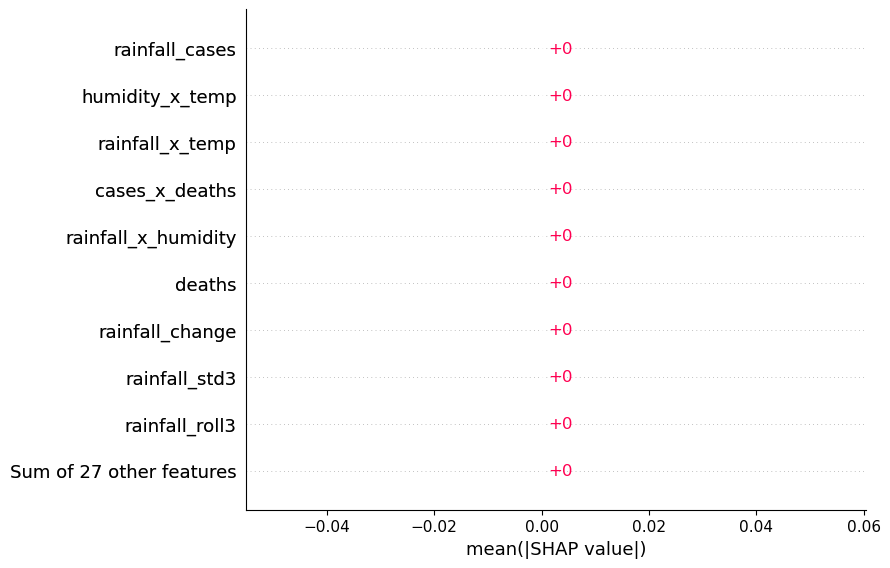

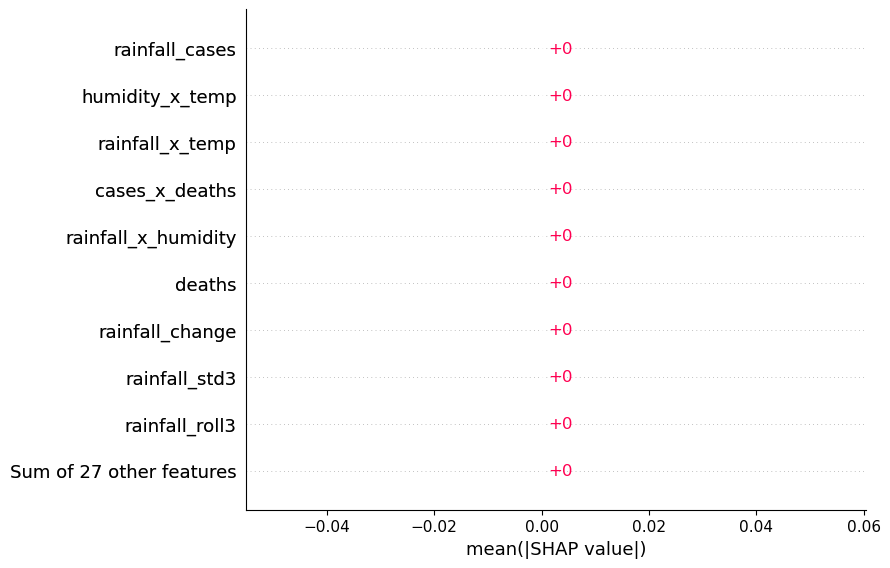

In [48]:
import pandas as pd

low_risk_sample = pd.DataFrame([{

    "month": 2,
    "month_sin": 0.866,
    "month_cos": 0.5,

    "cases": 5,
    "cases_lag1": 6,
    "cases_lag2": 8,
    "cases_lag3": 10,
    "cases_lag6": 12,
    "cases_lag12": 15,
    "cases_roll3": 8,
    "cases_std3": 2.0,
    "cases_growth": -0.25,

    "temperature_lag1": 24,
    "temperature_lag2": 24.5,
    "temperature_lag3": 25,

    "humidity_avg": 70,
    "humidity_lag1": 68,
    "humidity_lag2": 69,
    "humidity_lag6": 72,
    "humidity_roll3": 69,
    "humidity_std3": 1.5,

    "rainfall_avg": 80,
    "rainfall_lag1": 75,
    "rainfall_lag2": 70,
    "rainfall_lag3": 85,
    "rainfall_lag6": 90,
    "rainfall_lag12": 100,
    "rainfall_roll3": 76,
    "rainfall_std3": 5,
    "rainfall_change": -10,

    "deaths": 0,

    "rainfall_x_humidity": 5600,
    "cases_x_deaths": 0,
    "rainfall_x_temp": 2000,
    "humidity_x_temp": 1680,
    "rainfall_cases": 400

}])

high_risk_sample = pd.DataFrame([{

    "month": 9,
    "month_sin": -1,
    "month_cos": 0,

    "cases": 150,
    "cases_lag1": 120,
    "cases_lag2": 90,
    "cases_lag3": 70,
    "cases_lag6": 40,
    "cases_lag12": 30,
    "cases_roll3": 120,
    "cases_std3": 30,
    "cases_growth": 0.60,

    "temperature_lag1": 29,
    "temperature_lag2": 28.5,
    "temperature_lag3": 28,

    "humidity_avg": 90,
    "humidity_lag1": 88,
    "humidity_lag2": 87,
    "humidity_lag6": 85,
    "humidity_roll3": 88,
    "humidity_std3": 4,

    "rainfall_avg": 450,
    "rainfall_lag1": 420,
    "rainfall_lag2": 400,
    "rainfall_lag3": 380,
    "rainfall_lag6": 350,
    "rainfall_lag12": 300,
    "rainfall_roll3": 400,
    "rainfall_std3": 40,
    "rainfall_change": 50,

    "deaths": 10,

    "rainfall_x_humidity": 40500,
    "cases_x_deaths": 1500,
    "rainfall_x_temp": 13050,
    "humidity_x_temp": 2610,
    "rainfall_cases": 67500

}])
import joblib

model = joblib.load("cholera_ensemble_model.pkl")

prediction = model.predict(high_risk_sample)

probability = model.predict_proba(low_risk_sample)

print("Prediction:", prediction)
print("Probability:", probability)
import shap

explainer = shap.Explainer(model.predict, high_risk_sample)

shap_values = explainer(high_risk_sample)

shap.plots.bar(shap_values)
import shap

explainer = shap.Explainer(model.predict, low_risk_sample)

shap_values = explainer(low_risk_sample)

shap.plots.bar(shap_values)

In [8]:
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import accuracy_score, f1_score, classification_report
import numpy as np
import pandas as pd

monthly["cases_lag3"] = monthly["cases"].shift(3)
monthly["rainfall_lag3"] = monthly["rainfall_avg"].shift(3)
monthly["temperature_lag3"] = monthly["temperature_lag2"].shift(1)

monthly["rainfall_roll3"] = monthly["rainfall_avg"].rolling(3).mean()
monthly["humidity_roll3"] = monthly["humidity_avg"].rolling(3).mean()
monthly["cases_roll3"] = monthly["cases"].rolling(3).mean()

monthly["rainfall_x_humidity"] = monthly["rainfall_avg"] * monthly["humidity_avg"]
monthly["cases_x_deaths"] = monthly["cases"] * monthly["deaths"]

# Select features 
features = [
    "month","month_sin","month_cos",
    "cases","cases_lag1","cases_lag2","cases_lag3","cases_roll3",
    "temperature_lag1","temperature_lag2","temperature_lag3",
    "humidity_avg","humidity_lag1","humidity_lag2","humidity_roll3",
    "rainfall_lag1","rainfall_lag2","rainfall_lag3","rainfall_avg","rainfall_roll3",
    "deaths","rainfall_x_humidity","cases_x_deaths"
] 

X = monthly[features].dropna()
y = monthly.loc[X.index, "risk_level"]

#  Create hold-out (last 10% of data) -
holdout_size = int(len(X) * 0.1)
X_hold, y_hold = X[-holdout_size:], y[-holdout_size:]
X_rest, y_rest = X[:-holdout_size], y[:-holdout_size]

#Define models with best params
rf_best = RandomForestClassifier(
    n_estimators=300,
    max_depth=10,
    max_features=0.5,
    min_samples_split=2,
    min_samples_leaf=5,
    random_state=42
)

xgb_best = XGBClassifier(
    n_estimators=500,
    max_depth=3,
    learning_rate=0.01,
    subsample=1.0,
    colsample_bytree=0.6,
    gamma=0.1,
    reg_alpha=0,
    reg_lambda=5,
    random_state=42,
    use_label_encoder=False,
    eval_metric="mlogloss"
)

ensemble = VotingClassifier(
    estimators=[("rf", rf_best), ("xgb", xgb_best)],
    voting="soft"
)


tscv = TimeSeriesSplit(n_splits=5)

summary = []

# Evaluate each model
for model_name, model in {
    "Random Forest": rf_best,
    "XGBoost": xgb_best,
    "Ensemble": ensemble
}.items():
    # CV evaluation
    cv_accuracies = []
    cv_f1s = []
    cv_precisions = {"Low": [], "Medium": [], "High": []}
    cv_recalls = {"Low": [], "Medium": [], "High": []}

    for train_idx, test_idx in tscv.split(X_rest):
        X_train, X_test = X_rest.iloc[train_idx], X_rest.iloc[test_idx]
        y_train, y_test = y_rest.iloc[train_idx], y_rest.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        cv_accuracies.append(accuracy_score(y_test, y_pred))
        cv_f1s.append(f1_score(y_test, y_pred, average="macro"))

        report = classification_report(
            y_test, y_pred,
            target_names=["Low","Medium","High"],
            output_dict=True,
            zero_division=0
        )
        for cls in ["Low","Medium","High"]:
            cv_precisions[cls].append(report[cls]["precision"])
            cv_recalls[cls].append(report[cls]["recall"])

    # Final hold-out evaluation
    model.fit(X_rest, y_rest)
    y_hold_pred = model.predict(X_hold)
    holdout_acc = accuracy_score(y_hold, y_hold_pred)
    holdout_f1 = f1_score(y_hold, y_hold_pred, average="macro")
    holdout_report = classification_report(
        y_hold, y_hold_pred,
        target_names=["Low","Medium","High"],
        output_dict=True,
        zero_division=0
    )

    summary.append({
        "Model": model_name,
        "CV Accuracy": np.mean(cv_accuracies),
        "CV F1 (macro)": np.mean(cv_f1s),
        "CV Low Precision": np.mean(cv_precisions["Low"]),
        "CV Low Recall": np.mean(cv_recalls["Low"]),
        "CV Medium Precision": np.mean(cv_precisions["Medium"]),
        "CV Medium Recall": np.mean(cv_recalls["Medium"]),
        "CV High Precision": np.mean(cv_precisions["High"]),
        "CV High Recall": np.mean(cv_recalls["High"]),
        "Hold-out Accuracy": holdout_acc,
        "Hold-out F1 (macro)": holdout_f1,
        "Hold-out Low Precision": holdout_report["Low"]["precision"],
        "Hold-out Low Recall": holdout_report["Low"]["recall"],
        "Hold-out Medium Precision": holdout_report["Medium"]["precision"],
        "Hold-out Medium Recall": holdout_report["Medium"]["recall"],
        "Hold-out High Precision": holdout_report["High"]["precision"],
        "Hold-out High Recall": holdout_report["High"]["recall"]
    })

df_summary = pd.DataFrame(summary)
print(df_summary)

# --- Step 6: Save results ---
df_summary.to_csv("ensemble_full_results.csv", index=False)


C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [21:05:34] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [21:05:36] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [21:05:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [21:05:39] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update

           Model  CV Accuracy  CV F1 (macro)  CV Low Precision  CV Low Recall  \
0  Random Forest     0.650279       0.632156          0.687993       0.638974   
1        XGBoost     0.664804       0.648282          0.696407       0.681647   
2       Ensemble     0.651397       0.635187          0.685314       0.654506   

   CV Medium Precision  CV Medium Recall  CV High Precision  CV High Recall  \
0             0.528441          0.514486           0.717017        0.738142   
1             0.545054          0.530319           0.725338        0.729113   
2             0.530945          0.510223           0.715081        0.739083   

   Hold-out Accuracy  Hold-out F1 (macro)  Hold-out Low Precision  \
0           0.672269             0.656232                0.829787   
1           0.647059             0.629736                0.780000   
2           0.663866             0.649094                0.812500   

   Hold-out Low Recall  Hold-out Medium Precision  Hold-out Medium Recall  \
0   

In [8]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import accuracy_score, f1_score
import numpy as np
import pandas as pd

# --- Feature engineering (Step 5) ---
monthly["cases_lag3"] = monthly["cases"].shift(3)
monthly["rainfall_lag3"] = monthly["rainfall_avg"].shift(3)
monthly["temperature_lag3"] = monthly["temperature_lag2"].shift(1)

monthly["rainfall_roll3"] = monthly["rainfall_avg"].rolling(3).mean()
monthly["humidity_roll3"] = monthly["humidity_avg"].rolling(3).mean()
monthly["cases_roll3"] = monthly["cases"].rolling(3).mean()

monthly["rainfall_x_humidity"] = monthly["rainfall_avg"] * monthly["humidity_avg"]
monthly["cases_x_deaths"] = monthly["cases"] * monthly["deaths"]

region_cols = [col for col in monthly.columns if col.startswith("Region")]
features = [
    "month","month_sin","month_cos",
    "cases","cases_lag1","cases_lag2","cases_lag3","cases_roll3",
    "temperature_lag1","temperature_lag2","temperature_lag3",
    "humidity_avg","humidity_lag1","humidity_lag2","humidity_roll3",
    "rainfall_lag1","rainfall_lag2","rainfall_lag3","rainfall_avg","rainfall_roll3",
    "deaths","rainfall_x_humidity","cases_x_deaths"
] 

X = monthly[features].dropna()
y = monthly.loc[X.index, "risk_level"]

holdout_size = int(len(X) * 0.1)
X_hold, y_hold = X[-holdout_size:], y[-holdout_size:]
X_rest, y_rest = X[:-holdout_size], y[:-holdout_size]

tscv = TimeSeriesSplit(n_splits=5)

# Expanded parameter grids
param_grids = {
    "Random Forest": {
        "n_estimators": [300, 500, 1000],
        "max_depth": [None, 10, 20, 30],
        "max_features": ["sqrt", "log2", 0.5],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 5]
    },
    "XGBoost": {
        "n_estimators": [100, 300, 500],
        "max_depth": [3, 5, 7, 10],
        "learning_rate": [0.01, 0.05, 0.1],
        "subsample": [0.6, 0.8, 1.0],
        "colsample_bytree": [0.6, 0.8, 1.0],
        "gamma": [0, 0.1, 0.5],
        "reg_alpha": [0, 0.1, 1],
        "reg_lambda": [1, 5, 10]
    }
}

#Step 4: Base models
base_models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="mlogloss")
}

summary = []

# GridSearchCV with early stopping for XGBoost (Step 4) 
for model_name, model in base_models.items():
    print(f"Tuning {model_name}...")
    grid = GridSearchCV(model, param_grids[model_name], cv=tscv, scoring="f1_macro", n_jobs=-1)

    if model_name == "XGBoost":
        # Pass early stopping via fit_params
        grid.fit(
            X_rest, y_rest,
            **{
                "eval_set": [(X_hold, y_hold)],
               # "early_stopping_rounds": 50,
                "verbose": False
            }
        )
    else:
        grid.fit(X_rest, y_rest)

    best_model = grid.best_estimator_
    best_params = grid.best_params_
    best_cv_score = grid.best_score_

    # --- Final evaluation on hold-out ---
    best_model.fit(X_rest, y_rest)
    y_hold_pred = best_model.predict(X_hold)
    holdout_acc = accuracy_score(y_hold, y_hold_pred)
    holdout_f1 = f1_score(y_hold, y_hold_pred, average="macro")

    summary.append({
        "Model": model_name,
        "Best Params": best_params,
        "CV F1 (macro)": best_cv_score,
        "Hold-out Accuracy": holdout_acc,
        "Hold-out F1 (macro)": holdout_f1
    })

# --- Step 6: Summary table ---
df_summary = pd.DataFrame(summary)
print(df_summary)

# --- Step 7: Write to CSV ---
df_summary.to_csv("model_resultsp2.csv", index=False)


Tuning Random Forest...
Tuning XGBoost...


C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [13:30:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [13:30:50] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


           Model                                        Best Params  \
0  Random Forest  {'max_depth': 10, 'max_features': 0.5, 'min_sa...   
1        XGBoost  {'colsample_bytree': 0.6, 'gamma': 0.1, 'learn...   

   CV F1 (macro)  Hold-out Accuracy  Hold-out F1 (macro)  
0       0.632156           0.672269             0.656232  
1       0.648282           0.647059             0.629736  


In [231]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score, f1_score
import numpy as np
import pandas as pd

# --- One-hot encode region if needed ---
# X = pd.get_dummies(X, columns=["Region"], prefix="Region_")

# --- Step 1: Create hold-out (last 10% of data) ---
holdout_size = int(len(X) * 0.1)
X_hold, y_hold = X[-holdout_size:], y[-holdout_size:]
X_rest, y_rest = X[:-holdout_size], y[:-holdout_size]

# --- Step 2: Define CV strategy ---
tscv = TimeSeriesSplit(n_splits=5)

# --- Step 3: Define parameter grids ---
param_grids = {
    "Random Forest": {
        "n_estimators": [100, 300, 500],
        "max_depth": [None, 10, 20],
        "min_samples_split": [2, 5],
        "min_samples_leaf": [1, 2]
    },
    "XGBoost": {
        "n_estimators": [100, 300],
        "max_depth": [3, 5, 7],
        "learning_rate": [0.01, 0.1],
        "subsample": [0.8, 1.0],
        "colsample_bytree": [0.8, 1.0]
    },
    "LightGBM": {
        "n_estimators": [500, 1000],
        "learning_rate": [0.01, 0.05],
        "num_leaves": [31, 63],
        "max_depth": [-1, 10]
    }
}

# --- Step 4: Define base models ---
base_models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="mlogloss"),
    "LightGBM": LGBMClassifier(random_state=42)
}

summary = []

# --- Step 5: GridSearchCV for each model ---
for model_name, model in base_models.items():
    print(f"Tuning {model_name}...")
    grid = GridSearchCV(model, param_grids[model_name], cv=tscv, scoring="f1_macro", n_jobs=-1)
    grid.fit(X_rest, y_rest)

    best_model = grid.best_estimator_
    best_params = grid.best_params_
    best_cv_score = grid.best_score_

    # --- Step 6: Final evaluation on hold-out ---
    best_model.fit(X_rest, y_rest)
    y_hold_pred = best_model.predict(X_hold)
    holdout_acc = accuracy_score(y_hold, y_hold_pred)
    holdout_f1 = f1_score(y_hold, y_hold_pred, average="macro")

    summary.append({
        "Model": model_name,
        "Best Params": best_params,
        "CV F1 (macro)": best_cv_score,
        "Hold-out Accuracy": holdout_acc,
        "Hold-out F1 (macro)": holdout_f1
    })

# --- Step 7: Summary table ---
df_summary = pd.DataFrame(summary)
print(df_summary)

# --- Step 8: Write to CSV ---
df_summary.to_csv("model_results.csv", index=False)


Tuning Random Forest...
Tuning XGBoost...


C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [22:21:13] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [22:21:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Tuning LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3377
[LightGBM] [Info] Number of data points in the train set: 1105, number of used features: 17
[LightGBM] [Info] Start training from score -1.113198
[LightGBM] [Info] Start training from score -1.099518
[LightGBM] [Info] Start training from score -1.083345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

In [229]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
import pandas as pd

# --- One-hot encode region if needed ---
# X = pd.get_dummies(X, columns=["Region"], prefix="Region_")

# Define models
models = {
   # "Logistic Regression": LogisticRegression(max_iter=5000, solver="saga"),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=5,
                             random_state=42, use_label_encoder=False, eval_metric="mlogloss"),
    "LightGBM": LGBMClassifier(n_estimators=2000, learning_rate=0.01, max_depth=-5, random_state=42)
}

# --- Step 1: Create hold-out (last 10% of data) ---
holdout_size = int(len(X) * 0.1)
X_hold, y_hold = X[-holdout_size:], y[-holdout_size:]
X_rest, y_rest = X[:-holdout_size], y[:-holdout_size]

# --- Step 2: Cross-validation on the rest ---
tscv = TimeSeriesSplit(n_splits=10)

summary = []

for model_name, model in models.items():
    accuracies = []
    precisions = {"Low": [], "Medium": [], "High": []}
    recalls = {"Low": [], "Medium": [], "High": []}

    # CV loop
    for train_idx, test_idx in tscv.split(X_rest):
        X_train, X_cv = X_rest.iloc[train_idx], X_rest.iloc[test_idx]
        y_train, y_cv = y_rest.iloc[train_idx], y_rest.iloc[test_idx]

        model.fit(X_train, y_train)   # TRAINING
        y_pred = model.predict(X_cv)  # CV TEST

        acc = accuracy_score(y_cv, y_pred)
        accuracies.append(acc)

        report = classification_report(
            y_cv, y_pred,
            target_names=["Low","Medium","High"],
            output_dict=True,
            zero_division=0
        )

        for cls in ["Low","Medium","High"]:
            precisions[cls].append(report[cls]["precision"])
            recalls[cls].append(report[cls]["recall"])

    # --- Step 3: Final evaluation on hold-out ---
    model.fit(X_rest, y_rest)  # retrain on all non-hold-out data
    y_hold_pred = model.predict(X_hold)
    holdout_acc = accuracy_score(y_hold, y_hold_pred)

    # Store results
    summary.append({
        "Model": model_name,
        "CV Accuracy": float(np.mean(accuracies)),
        "Hold-out Accuracy": holdout_acc,
        "Low Precision (CV)": float(np.mean(precisions["Low"])),
        "Low Recall (CV)": float(np.mean(recalls["Low"])),
        "Medium Precision (CV)": float(np.mean(precisions["Medium"])),
        "Medium Recall (CV)": float(np.mean(recalls["Medium"])),
        "High Precision (CV)": float(np.mean(precisions["High"])),
        "High Recall (CV)": float(np.mean(recalls["High"]))
    })

# --- Step 4: Summary table ---
df_summary = pd.DataFrame(summary)
print(df_summary)


C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:47:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:47:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:47:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:47:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 105, number of used features: 17
[LightGBM] [Info] Start training from score -0.559616
[LightGBM] [Info] Start training from score -0.892760
[LightGBM] [Info] Start training from score -3.960813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

In [228]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
import pandas as pd

# --- One-hot encode region ---
#X = pd.get_dummies(X, columns=["Region"], prefix="Region_")
# Define models
models = {

    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42, use_label_encoder=False, eval_metric="mlogloss"),
    "LightGBM": LGBMClassifier(n_estimators=2000, learning_rate=0.01, max_depth=-5, random_state=42)
}

tscv = TimeSeriesSplit(n_splits=10)

summary = []

for model_name, model in models.items():
    accuracies = []
    precisions = {"Low": [], "Medium": [], "High": []}
    recalls = {"Low": [], "Medium": [], "High": []}

    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        acc = accuracy_score(y_test, y_pred)
        accuracies.append(acc)

        report = classification_report(
            y_test, y_pred,
            target_names=["Low","Medium","High"],
            output_dict=True,
            zero_division=0
        )

        for cls in ["Low","Medium","High"]:
            precisions[cls].append(report[cls]["precision"])
            recalls[cls].append(report[cls]["recall"])

    # Store averages
    summary.append({
        "Model": model_name,
        "Accuracy": float(np.mean(accuracies)),
        "Low Precision": float(np.mean(precisions["Low"])),
        "Low Recall": float(np.mean(recalls["Low"])),
        "Medium Precision": float(np.mean(precisions["Medium"])),
        "Medium Recall": float(np.mean(recalls["Medium"])),
        "High Precision": float(np.mean(precisions["High"])),
        "High Recall": float(np.mean(recalls["High"]))
    })

# Convert to DataFrame for nice table
df_summary = pd.DataFrame(summary)
print(df_summary)

C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:32:30] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:32:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:32:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [20:32:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000144 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 527
[LightGBM] [Info] Number of data points in the train set: 117, number of used features: 17
[LightGBM] [Info] Start training from score -0.557481
[LightGBM] [Info] Start training from score -0.955511
[LightGBM] [Info] Start training from score -3.152736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

In [166]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
import pandas as pd

# --- One-hot encode region ---
X = pd.get_dummies(X, columns=["Region"], prefix="Region_")
# Define models
models = {

    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42, use_label_encoder=False, eval_metric="mlogloss"),
    "LightGBM": LGBMClassifier(n_estimators=200, learning_rate=0.1, max_depth=-5, random_state=42)
}

tscv = TimeSeriesSplit(n_splits=10)

summary = []

for model_name, model in models.items():
    accuracies = []
    precisions = {"Low": [], "Medium": [], "High": []}
    recalls = {"Low": [], "Medium": [], "High": []}

    for train_idx, test_idx in tscv.split(X_base):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        acc = accuracy_score(y_test, y_pred)
        accuracies.append(acc)

        report = classification_report(
            y_test, y_pred,
            target_names=["Low","Medium","High"],
            output_dict=True,
            zero_division=0
        )

        for cls in ["Low","Medium","High"]:
            precisions[cls].append(report[cls]["precision"])
            recalls[cls].append(report[cls]["recall"])

    # Store averages
    summary.append({
        "Model": model_name,
        "Accuracy": float(np.mean(accuracies)),
        "Low Precision": float(np.mean(precisions["Low"])),
        "Low Recall": float(np.mean(recalls["Low"])),
        "Medium Precision": float(np.mean(precisions["Medium"])),
        "Medium Recall": float(np.mean(recalls["Medium"])),
        "High Precision": float(np.mean(precisions["High"])),
        "High Recall": float(np.mean(recalls["High"]))
    })

# Convert to DataFrame for nice table
df_summary = pd.DataFrame(summary)
print(df_summary)

C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [10:06:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [10:06:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [10:06:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [10:06:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 117, number of used features: 16
[LightGBM] [Info] Start training from score -0.557481
[LightGBM] [Info] Start training from score -0.955511
[LightGBM] [Info] Start training from score -3.152736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fur

In [144]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
import pandas as pd

# --- One-hot encode region ---
X = pd.get_dummies(X, columns=["Region"], prefix="Region_")
# Define models
models = {

    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "XGBoost": XGBClassifier(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42, use_label_encoder=False, eval_metric="mlogloss"),
    "LightGBM": LGBMClassifier(n_estimators=200, learning_rate=0.1, max_depth=-1, random_state=42)
}

tscv = TimeSeriesSplit(n_splits=10)

summary = []

for model_name, model in models.items():
    accuracies = []
    precisions = {"Low": [], "Medium": [], "High": []}
    recalls = {"Low": [], "Medium": [], "High": []}

    for train_idx, test_idx in tscv.split(X_base):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        acc = accuracy_score(y_test, y_pred)
        accuracies.append(acc)

        report = classification_report(
            y_test, y_pred,
            target_names=["Low","Medium","High"],
            output_dict=True,
            zero_division=0
        )

        for cls in ["Low","Medium","High"]:
            precisions[cls].append(report[cls]["precision"])
            recalls[cls].append(report[cls]["recall"])

    # Store averages
    summary.append({
        "Model": model_name,
        "Accuracy": float(np.mean(accuracies)),
        "Low Precision": float(np.mean(precisions["Low"])),
        "Low Recall": float(np.mean(recalls["Low"])),
        "Medium Precision": float(np.mean(precisions["Medium"])),
        "Medium Recall": float(np.mean(recalls["Medium"])),
        "High Precision": float(np.mean(precisions["High"])),
        "High Recall": float(np.mean(recalls["High"]))
    })

# Convert to DataFrame for nice table
df_summary = pd.DataFrame(summary)
print(df_summary)

C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [08:51:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [08:51:43] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [08:51:44] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Yangsi\anaconda3\Lib\site-packages\xgboost\training.py:200: UserWarning: [08:51:45] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 117, number of used features: 16
[LightGBM] [Info] Start training from score -0.557481
[LightGBM] [Info] Start training from score -0.955511
[LightGBM] [Info] Start training from score -3.152736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

In [47]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import pandas as pd

# After fitting RandomForest baseline
rf.fit(X_train, y_train)

# Built-in importance
importances = rf.feature_importances_
feat_imp = pd.DataFrame({"Feature": X_train.columns, "Importance": importances})
print("=== Random Forest Built-in Feature Importance ===")
print(feat_imp.sort_values("Importance", ascending=False).head(10))

# Permutation importance
perm = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=42)
perm_imp = pd.DataFrame({"Feature": X_test.columns, "Importance": perm.importances_mean})
print("=== Random Forest Permutation Feature Importance ===")
print(perm_imp.sort_values("Importance", ascending=False).head(10))


NameError: name 'rf' is not defined

In [ ]:
# Select features and target
region_cols = [col for col in monthly.columns if col.startswith("Region_")]

features = [
   # "month_sin",
    #"cases_pct_change_1m",
    #"cases_rolling_mean_3m",
    #"month_cos",
   # "rainfall_avg",    
   # "log_cases_lag1", 
    #"log_cases_lag2",
    "month",
    "Region",
   # "log_cases",
    "temperature_avg",
    "humidity_avg",
  #  "rainfall_lag1",
 #   "rainfall_lag2",
  #  "temperature_lag1",
 #   "temperature_lag2",
 #   "humidity_lag1",
 #   "humidity_lag2"
] + region_cols

X = monthly[features]
y = monthly["risk_level"]


In [19]:
# Select features and target
region_cols = [col for col in monthly.columns if col.startswith("Region_")]

features = [
    "month_sin",
    #"cases_pct_change_1m",
    #"cases_rolling_mean_3m",
    "month_cos",
    "rainfall_avg",    
    "log_cases_lag1", 
     "log_cases_lag2",
   # "month",
    "log_cases",
    "temperature_avg",
    "humidity_avg",
    "rainfall_lag1",
   "rainfall_lag2",
    "temperature_lag1",
    "temperature_lag2",
    "humidity_lag1",
    "humidity_lag2"
] + region_cols



In [35]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import TimeSeriesSplit

# -----------------------------
# 1. Prepare dataset
df = pd.read_csv("FINAL regional_cholera_environment_dataset.csv")
df["cases"] = df["sCh"] + df["cCh"]

# Cyclic month encoding
df["TR"] = pd.to_datetime(df["TL"], format="%m/%d/%Y")
df["month"] = df["TR"].dt.month
df["month_sin"] = np.sin(2 * np.pi * df["month"]/12)
df["month_cos"] = np.cos(2 * np.pi * df["month"]/12)

# Lag features
df["cases_lag1"] = df["cases"].shift(1)
df["cases_lag2"] = df["cases"].shift(2)
df["rainfall_lag1"] = df["rainfall_avg"].shift(1)
df["rainfall_lag2"] = df["rainfall_avg"].shift(2)
df["temperature_lag1"] = df["temperature_avg"].shift(1)
df["temperature_lag2"] = df["temperature_avg"].shift(2)
df["humidity_lag1"] = df["humidity_avg"].shift(1)
df["humidity_lag2"] = df["humidity_avg"].shift(2)

# Target = next month's cases
df["cases_next"] = df["cases"].shift(-1)

# Drop rows with NaNs
df = df.dropna()

# One-hot encode regions
region_cols = pd.get_dummies(df["Region"], prefix="Region")
df = pd.concat([df, region_cols], axis=1)

# -----------------------------
# 2. Feature matrix + target
# -----------------------------
features = [
    "month_sin","month_cos","rainfall_avg","cases_lag1","cases_lag2",
    "month","cases","temperature_avg","humidity_avg",
    "rainfall_lag1","rainfall_lag2","temperature_lag1","temperature_lag2",
    "humidity_lag1","humidity_lag2"
] + list(region_cols.columns)

X = df[features].values
y = df["cases_next"].values

# Clean NaNs/Infs
X = np.nan_to_num(X, nan=0.0, posinf=1e6, neginf=-1e6)
y = np.nan_to_num(y, nan=0.0, posinf=1e6, neginf=-1e6)

# Scale
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_scaled = scaler_X.fit_transform(X)
y_scaled = scaler_y.fit_transform(y.reshape(-1,1))

# -----------------------------
# 3. Build sequences (12 months history)
# -----------------------------
sequence_length = 12
X_seq, y_seq = [], []
for i in range(len(X_scaled) - sequence_length):
    X_seq.append(X_scaled[i:i+sequence_length])
    y_seq.append(y_scaled[i+sequence_length])
X_seq, y_seq = np.array(X_seq), np.array(y_seq)

# -----------------------------
# 4. TimeSeriesSplit evaluation
# -----------------------------
tscv = TimeSeriesSplit(n_splits=5)
fold = 1
mae_scores, rmse_scores, r2_scores = [], [], []

for train_idx, test_idx in tscv.split(X_seq):
    X_train, X_test = X_seq[train_idx], X_seq[test_idx]
    y_train, y_test = y_seq[train_idx], y_seq[test_idx]

    # Build model fresh for each fold
    model = Sequential()
    model.add(tf.keras.layers.Input(shape=(X_train.shape[1], X_train.shape[2])))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1))
    model.compile(loss="mse", optimizer=Adam(learning_rate=0.0005, clipnorm=1.0))

    # Train
    model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    # Predict
    y_pred_scaled = model.predict(X_test)
    y_pred = scaler_y.inverse_transform(y_pred_scaled)
    y_test_inv = scaler_y.inverse_transform(y_test)

    # Metrics
    mae = mean_absolute_error(y_test_inv, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred))
    r2 = r2_score(y_test_inv, y_pred)

    mae_scores.append(mae)
    rmse_scores.append(rmse)
    r2_scores.append(r2)

    print(f"Fold {fold} → MAE: {mae:.3f}, RMSE: {rmse:.3f}, R²: {r2:.3f}")
    fold += 1

# -----------------------------
# 5. Average performance
# -----------------------------
print("Average MAE:", np.mean(mae_scores))
print("Average RMSE:", np.mean(rmse_scores))
print("Average R²:", np.mean(r2_scores))

# -----------------------------
# 6. Final forecast for next month
# -----------------------------
last_input = X_seq[-1].reshape((1, sequence_length, X_seq.shape[2]))
next_pred_scaled = model.predict(last_input)
next_pred = scaler_y.inverse_transform(next_pred_scaled)
print("Next month predicted cases:", max(0, next_pred[0][0]))  # clip negatives


24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Fold 1 → MAE: 345.169, RMSE: 413.165, R²: -2.354
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Fold 2 → MAE: 286.350, RMSE: 435.532, R²: -0.353
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Fold 3 → MAE: 193.882, RMSE: 271.675, R²: -0.306
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
Fold 4 → MAE: 135.277, RMSE: 191.233, R²: -0.425
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
Fold 5 → MAE: 126.625, RMSE: 181.585, R²: 0.102
Average MAE: 217.4604835792139
Average RMSE: 298.6380503711671
Average R²: -0.667412753121915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Next month predicted cases: 32.417233


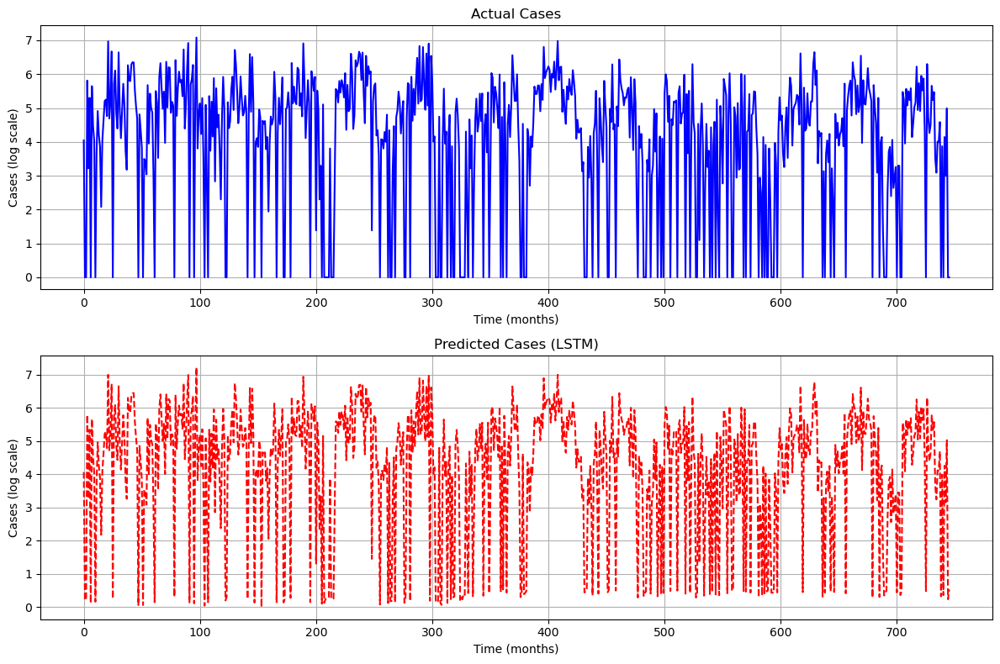

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))

# Actual
plt.subplot(2,1,1)
plt.plot(y_test_inv, label="Actual cases", color="blue")
plt.title("Actual Cases")
plt.xlabel("Time (months)")
plt.ylabel("Cases (log scale)")
plt.grid(True)

# Predicted
plt.subplot(2,1,2)
plt.plot(y_pred, label="Predicted cases", color="red", linestyle="--")
plt.title("Predicted Cases (LSTM)")
plt.xlabel("Time (months)")
plt.ylabel("Cases (log scale)")
plt.grid(True)

plt.tight_layout()
plt.show()


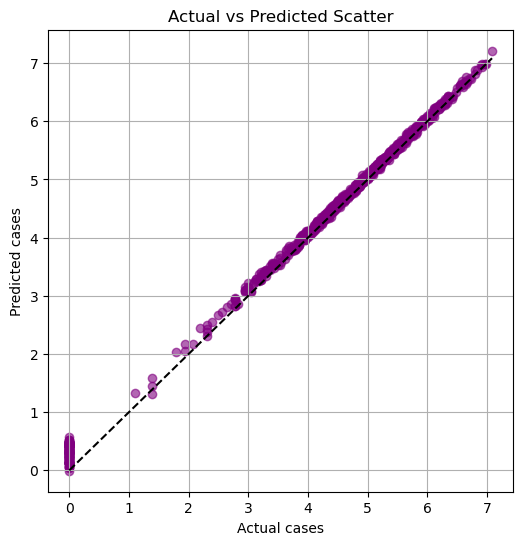

In [31]:
plt.figure(figsize=(6,6))
plt.scatter(y_test_inv, y_pred, alpha=0.6, color="purple")
plt.plot([min(y_test_inv), max(y_test_inv)],
         [min(y_test_inv), max(y_test_inv)], color="black", linestyle="--")
plt.title("Actual vs Predicted Scatter")
plt.xlabel("Actual cases")
plt.ylabel("Predicted cases")
plt.grid(True)
plt.show()


In [279]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
import numpy as np
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# Define time series CV strategy
tscv = TimeSeriesSplit(n_splits=5)

models = {
    "Logistic Regression": make_pipeline(
        StandardScaler(),
        LogisticRegression(max_iter=5000, solver="lbfgs", random_state=42)
    ),
    "Random Forest": RandomForestClassifier(
        n_estimators=500,
        max_depth=10,
        min_samples_leaf=5,
        random_state=42
    ),
    "XGBoost": XGBClassifier(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=4,
        subsample=0.8,
        colsample_bytree=0.8,
        eval_metric="mlogloss",
        random_state=42
    ),
    "LightGBM": LGBMClassifier(random_state=42)
}

# Loop through models and evaluate with TimeSeriesSplit
for name, model in models.items():
    all_preds = np.zeros_like(y)  # placeholder for predictions
    
    for train_idx, test_idx in tscv.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
        
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        all_preds[test_idx] = y_pred
    
    print(f"{name} Report:\n")
    print(classification_report(y, all_preds, target_names=["Low", "Medium", "High"]))
    print("Accuracy:", accuracy_score(y, all_preds))
    print("-" * 60)


Logistic Regression Report:

              precision    recall  f1-score   support

         Low       0.60      0.74      0.66       409
      Medium       0.50      0.49      0.50       410
        High       0.66      0.51      0.57       408

    accuracy                           0.58      1227
   macro avg       0.59      0.58      0.58      1227
weighted avg       0.59      0.58      0.58      1227

Accuracy: 0.5810920945395273
------------------------------------------------------------
Random Forest Report:

              precision    recall  f1-score   support

         Low       0.60      0.79      0.68       409
      Medium       0.56      0.41      0.47       410
        High       0.66      0.63      0.64       408

    accuracy                           0.61      1227
   macro avg       0.61      0.61      0.60      1227
weighted avg       0.61      0.61      0.60      1227

Accuracy: 0.60880195599022
------------------------------------------------------------
XGBoost 

Interaction features added: ['rainfall_avg_x_temperature_avg', 'rainfall_avg_x_humidity_avg', 'rainfall_avg_x_log_cases', 'temperature_avg_x_humidity_avg', 'temperature_avg_x_log_cases', 'humidity_avg_x_log_cases', 'rainfall_lag1_x_temp_lag1', 'rainfall_lag2_x_humidity_lag2']

=== Fold 1 ===
Train indices: 0–206, Test indices: 207–410
              precision    recall  f1-score   support

         Low       0.56      0.67      0.61        72
      Medium       0.50      0.32      0.39        82
        High       0.45      0.60      0.51        50

    accuracy                           0.51       204
   macro avg       0.50      0.53      0.50       204
weighted avg       0.51      0.51      0.50       204

Accuracy: 0.5098039215686274

=== Fold 2 ===
Train indices: 0–410, Test indices: 411–614
              precision    recall  f1-score   support

         Low       0.78      0.51      0.62        35
      Medium       0.51      0.47      0.49        53
        High       0.77      0

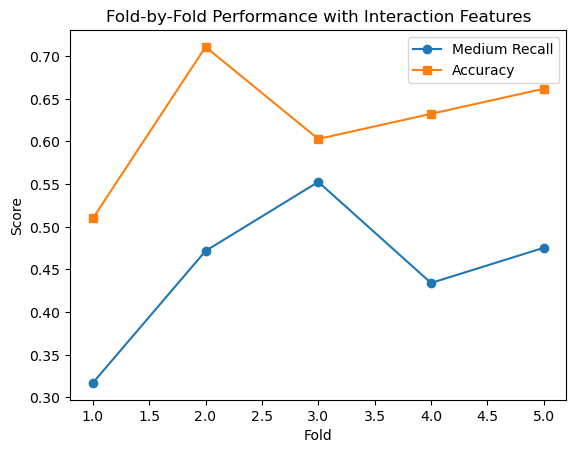

In [281]:
import numpy as np
import pandas as pd
from itertools import combinations
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier

# --- Your base features ---
region_cols = [col for col in monthly.columns if col.startswith("Region_")]

features = [
    "month_sin",
    "month_cos",
    "rainfall_avg",    
    "log_cases_lag1", 
    "log_cases_lag2",
    "month",
    "log_cases",
    "temperature_avg",
    "humidity_avg",
    "rainfall_lag1",
    "rainfall_lag2",
    "temperature_lag1",
    "temperature_lag2",
    "humidity_lag1",
    "humidity_lag2"
] + region_cols

X = monthly[features].copy()
y = monthly["risk_level"]

# --- Add interaction terms ---
# Choose a subset of meaningful features for interactions
base_for_interactions = ["rainfall_avg", "temperature_avg", "humidity_avg", "log_cases"]

for f1, f2 in combinations(base_for_interactions, 2):
    X[f"{f1}_x_{f2}"] = X[f1] * X[f2]

# Example lagged interactions
X["rainfall_lag1_x_temp_lag1"] = X["rainfall_lag1"] * X["temperature_lag1"]
X["rainfall_lag2_x_humidity_lag2"] = X["rainfall_lag2"] * X["humidity_lag2"]

print("Interaction features added:", [col for col in X.columns if "_x_" in col])

# --- Define model ---
model = RandomForestClassifier(
    n_estimators=300,
    max_depth=8,
    min_samples_leaf=5,
    random_state=42
)

# --- TimeSeriesSplit evaluation ---
tscv = TimeSeriesSplit(n_splits=5)
fold_results = []

for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=["Low","Medium","High"], output_dict=True)

    fold_results.append({
        "Fold": fold+1,
        "Train period": f"{train_idx[0]}–{train_idx[-1]}",
        "Test period": f"{test_idx[0]}–{test_idx[-1]}",
        "Accuracy": acc,
        "Macro F1": report["macro avg"]["f1-score"],
        "Medium Recall": report["Medium"]["recall"]
    })

    print(f"\n=== Fold {fold+1} ===")
    print(f"Train indices: {train_idx[0]}–{train_idx[-1]}, Test indices: {test_idx[0]}–{test_idx[-1]}")
    print(classification_report(y_test, y_pred, target_names=["Low","Medium","High"]))
    print("Accuracy:", acc)

# --- Summary DataFrame ---
df_results = pd.DataFrame(fold_results)
print("\nFold-by-fold summary:\n", df_results)

# --- Optional: plot Medium recall across folds ---
import matplotlib.pyplot as plt

plt.plot(df_results["Fold"], df_results["Medium Recall"], marker="o", label="Medium Recall")
plt.plot(df_results["Fold"], df_results["Accuracy"], marker="s", label="Accuracy")
plt.xlabel("Fold")
plt.ylabel("Score")
plt.title("Fold-by-Fold Performance with Interaction Features")
plt.legend()
plt.show()


                           Feature  Importance
6                        log_cases    0.165252
29     temperature_avg_x_log_cases    0.127083
30        humidity_avg_x_log_cases    0.099808
3                   log_cases_lag1    0.087866
4                   log_cases_lag2    0.059420
27        rainfall_avg_x_log_cases    0.042267
1                        month_cos    0.038335
5                            month    0.035947
12                temperature_lag2    0.031025
11                temperature_lag1    0.027579
7                  temperature_avg    0.025451
32   rainfall_lag2_x_humidity_lag2    0.023928
14                   humidity_lag2    0.023805
25  rainfall_avg_x_temperature_avg    0.023475
28  temperature_avg_x_humidity_avg    0.021945
8                     humidity_avg    0.021195
26     rainfall_avg_x_humidity_avg    0.020412
10                   rainfall_lag2    0.019977
13                   humidity_lag1    0.018497
2                     rainfall_avg    0.018126


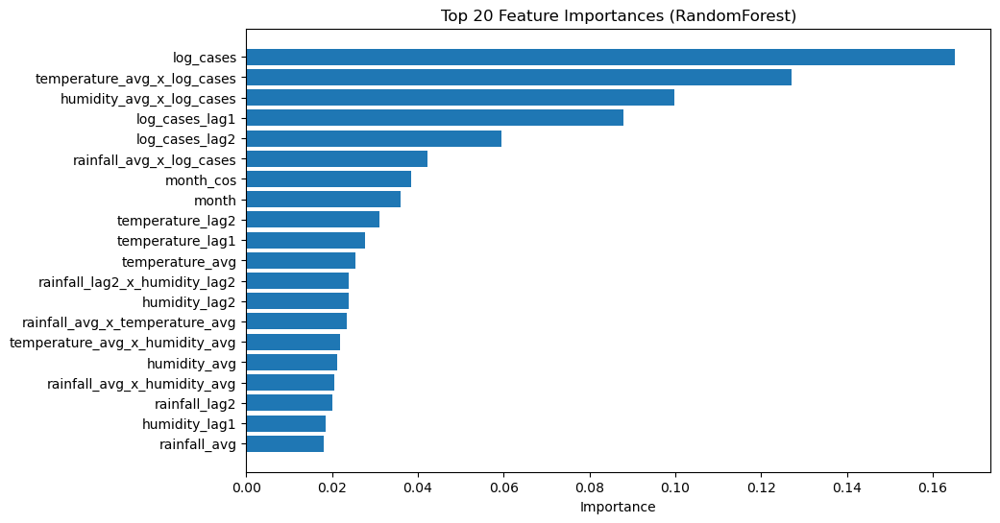

In [283]:
import pandas as pd
import matplotlib.pyplot as plt

# After fitting your RandomForest model
model.fit(X_train, y_train)

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns

# Put into a DataFrame for easy viewing
feat_imp = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

print(feat_imp.head(20))  # top 20 features

# Plot top features
plt.figure(figsize=(10,6))
plt.barh(feat_imp["Feature"][:20][::-1], feat_imp["Importance"][:20][::-1])
plt.xlabel("Importance")
plt.title("Top 20 Feature Importances (RandomForest)")
plt.show()


In [285]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import classification_report
import pandas as pd

# Select the base features you want interactions for
base_features = ["rainfall_avg","temperature_avg","humidity_avg"]

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_inter = poly.fit_transform(X[base_features])

# Get the names of the generated features
feature_names = poly.get_feature_names_out(base_features)

# Convert back to DataFrame
X_poly = pd.DataFrame(X_inter, columns=feature_names, index=X.index)

# Combine with your other features (lags, month, region, etc.)
X_full = pd.concat([X.drop(columns=base_features), X_poly], axis=1)

# Train a model (example: RandomForest)
model = RandomForestClassifier(n_estimators=300, max_depth=8, random_state=42)
tscv = TimeSeriesSplit(n_splits=5)

for fold, (train_idx, test_idx) in enumerate(tscv.split(X_full)):
    X_train, X_test = X_full.iloc[train_idx], X_full.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"\n=== Fold {fold+1} ===")
    print(classification_report(y_test, y_pred, target_names=["Low","Medium","High"]))

# After fitting, check feature importance
importances = model.feature_importances_
feat_imp = pd.DataFrame({
    "Feature": X_full.columns,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

print("\nTop features:\n", feat_imp.head(20))



=== Fold 1 ===
              precision    recall  f1-score   support

         Low       0.49      0.64      0.55        72
      Medium       0.52      0.34      0.41        82
        High       0.41      0.46      0.43        50

    accuracy                           0.48       204
   macro avg       0.47      0.48      0.47       204
weighted avg       0.48      0.48      0.47       204


=== Fold 2 ===
              precision    recall  f1-score   support

         Low       0.73      0.54      0.62        35
      Medium       0.59      0.49      0.54        53
        High       0.78      0.91      0.84       116

    accuracy                           0.74       204
   macro avg       0.70      0.65      0.67       204
weighted avg       0.72      0.74      0.72       204


=== Fold 3 ===
              precision    recall  f1-score   support

         Low       0.66      0.62      0.64        53
      Medium       0.46      0.55      0.50        76
        High       0.68    

In [257]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier

# -----------------------------
# 1. Sample data (one-hot regions included)
# -----------------------------
sample_data = pd.DataFrame([{
    "rainfall_avg": 120.5,
    "log_cases": np.log1p(15),        # 15 cases
    "log_cases_lag1": np.log1p(12),   # previous month cases
    "log_cases_lag2": np.log1p(10),   # two months ago
    "temperature_avg": 27.3,
    "humidity_avg": 75.0,
    "rainfall_lag1": 110.0,
    "Region_North": 1,
    "Region_South": 0,
    "Region_East": 0,
    "Region_West": 0
}])

# -----------------------------
# 2. Dummy target (risk_level)
# -----------------------------
y = np.array([1])  # just a placeholder target

# -----------------------------
# 3. Train a simple RandomForest
# -----------------------------
model = RandomForestClassifier(
    n_estimators=100,
    max_depth=5,
    random_state=42
)

# For demonstration, train on repeated sample data
X_train = pd.concat([sample_data]*20, ignore_index=True)
y_train = np.random.choice([0,1,2], size=20)  # random risk levels
model.fit(X_train, y_train)

# -----------------------------
# 4. Predict on new data
# -----------------------------
risk_pred = model.predict(sample_data)[0]
risk_map = {0: "Low", 1: "Medium", 2: "High"}
print("Predicted risk:", risk_map[risk_pred])


Predicted risk: High


In [185]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import make_scorer, f1_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define scorers
scorers = {
    "accuracy": "accuracy",
    "f1_macro": make_scorer(f1_score, average="macro"),
    "roc_auc_ovr": "roc_auc_ovr"   # built-in multiclass ROC AUC scorer
}

# Logistic Regression
log_reg = make_pipeline(
    StandardScaler(),
    LogisticRegression(max_iter=5000, solver="lbfgs", random_state=42)
)
log_params = {"logisticregression__C":[0.1,1,10]}
log_grid = GridSearchCV(log_reg, log_params, cv=cv, scoring=scorers, refit="f1_macro")
log_grid.fit(X, y)
print("Logistic Regression best params:", log_grid.best_params_)
print("Scores:", log_grid.cv_results_["mean_test_f1_macro"][log_grid.best_index_],
      log_grid.cv_results_["mean_test_roc_auc_ovr"][log_grid.best_index_])

# Random Forest
rf = RandomForestClassifier(random_state=42)
rf_params = {"n_estimators":[100,300],"max_depth":[None,10,20]}
rf_grid = GridSearchCV(rf, rf_params, cv=cv, scoring=scorers, refit="f1_macro")
rf_grid.fit(X, y)
print("Random Forest best params:", rf_grid.best_params_)
print("Scores:", rf_grid.cv_results_["mean_test_f1_macro"][rf_grid.best_index_],
      rf_grid.cv_results_["mean_test_roc_auc_ovr"][rf_grid.best_index_])

# XGBoost
xgb = XGBClassifier(eval_metric="logloss", random_state=42)
xgb_params = {"n_estimators":[100,300],"max_depth":[3,6],"learning_rate":[0.05,0.1]}
xgb_grid = GridSearchCV(xgb, xgb_params, cv=cv, scoring=scorers, refit="f1_macro")
xgb_grid.fit(X, y)
print("XGB best params:", xgb_grid.best_params_)
print("Scores:", xgb_grid.cv_results_["mean_test_f1_macro"][xgb_grid.best_index_],
      xgb_grid.cv_results_["mean_test_roc_auc_ovr"][xgb_grid.best_index_])

# LightGBM
lgbm = LGBMClassifier(random_state=42)
lgbm_params = {"n_estimators":[100,300],"max_depth":[-1,10],"learning_rate":[0.05,0.1]}
lgbm_grid = GridSearchCV(lgbm, lgbm_params, cv=cv, scoring=scorers, refit="f1_macro")
lgbm_grid.fit(X, y)
print("LightGBM best params:", lgbm_grid.best_params_)
print("Scores:", lgbm_grid.cv_results_["mean_test_f1_macro"][lgbm_grid.best_index_],
      lgbm_grid.cv_results_["mean_test_roc_auc_ovr"][lgbm_grid.best_index_])


Logistic Regression best params: {'logisticregression__C': 10}
Scores: 0.6807406645096988 0.8521738501436312
Random Forest best params: {'max_depth': 10, 'n_estimators': 100}
Scores: 0.6979057569391354 0.8606925825314249
XGB best params: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 300}
Scores: 0.6891831220580513 0.8451548441338292
LightGBM best params: {'learning_rate': 0.1, 'max_depth': -1, 'n_estimators': 300}
Scores: 0.6837557383117162 0.8406915845999645


In [191]:
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Base learners
estimators = [
    ('rf', RandomForestClassifier(max_depth=10, n_estimators=100, random_state=42)),
    ('xgb', XGBClassifier(learning_rate=0.1, max_depth=6, n_estimators=300, eval_metric="logloss", random_state=42)),
    ('lgbm', LGBMClassifier(learning_rate=0.1, max_depth=-1, n_estimators=300, random_state=42))
]

# Meta learner (Logistic Regression with scaling)
final_estimator = make_pipeline(
    StandardScaler(),
    LogisticRegression(max_iter=5000, solver="lbfgs", random_state=42)
)

stack = StackingClassifier(
    estimators=estimators,
    final_estimator=final_estimator,
    cv=cv
)

scores_f1 = cross_val_score(stack, X, y, cv=cv, scoring="f1_macro")
scores_auc = cross_val_score(stack, X, y, cv=cv, scoring="roc_auc_ovr")
scores_acc = cross_val_score(stack, X, y, cv=cv, scoring="accuracy")


print("Stacking Ensemble mean F1-macro:", np.mean(scores_f1))
print("Stacking Ensemble mean ROC AUC:", np.mean(scores_auc))
print("Stacking Ensemble mean Accuracy:", np.mean(scores_acc))



Stacking Ensemble mean F1-macro: 0.7033257721179648
Stacking Ensemble mean ROC AUC: 0.8596891380045417
Stacking Ensemble mean Accuracy: 0.7024788451966153


In [190]:
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, cross_val_score
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Base learners
estimators = [
    ('rf', RandomForestClassifier(max_depth=10, n_estimators=200, random_state=42)),
    ('xgb', XGBClassifier(learning_rate=0.05, max_depth=6, n_estimators=500,
                          subsample=0.8, colsample_bytree=0.8,
                          eval_metric="logloss", random_state=42)),
    ('lgbm', LGBMClassifier(learning_rate=0.05, max_depth=-1, n_estimators=500,
                            subsample=0.8, colsample_bytree=0.8, random_state=42)),
    ('gb', GradientBoostingClassifier(n_estimators=300, learning_rate=0.05, max_depth=5, random_state=42)),
    ('svc', make_pipeline(StandardScaler(),
                          SVC(probability=True, kernel="rbf", C=1.0, gamma="scale", random_state=42)))
]

# Meta learner
final_estimator = make_pipeline(
    StandardScaler(),
    LogisticRegression(max_iter=5000, solver="lbfgs", random_state=42)
)

stack = StackingClassifier(
    estimators=estimators,
    final_estimator=final_estimator,
    cv=cv
)

# Evaluate with multiple metrics
scores_f1 = cross_val_score(stack, X, y, cv=cv, scoring="f1_macro")
scores_auc = cross_val_score(stack, X, y, cv=cv, scoring="roc_auc_ovr")
scores_acc = cross_val_score(stack, X, y, cv=cv, scoring="accuracy")

print("Stacking Ensemble mean F1-macro:", np.mean(scores_f1))
print("Stacking Ensemble mean ROC AUC:", np.mean(scores_auc))
print("Stacking Ensemble mean Accuracy:", np.mean(scores_acc))


Stacking Ensemble mean F1-macro: 0.6988303052739804
Stacking Ensemble mean ROC AUC: 0.8604786441691207
Stacking Ensemble mean Accuracy: 0.6984038493446159


Correlation with risk_level:
risk_level          1.000000
log_cases           0.598158
log_cases_lag1      0.506387
log_cases_lag2      0.424209
rainfall_avg        0.329651
temperature_lag2    0.220136
rainfall_lag1       0.196819
temperature_lag1    0.190701
humidity_avg        0.174311
temperature_avg     0.158472
humidity_lag1       0.067576
rainfall_lag2       0.023200
month              -0.029882
humidity_lag2      -0.031822
month_sin          -0.132529
month_cos          -0.399996
Name: risk_level, dtype: float64


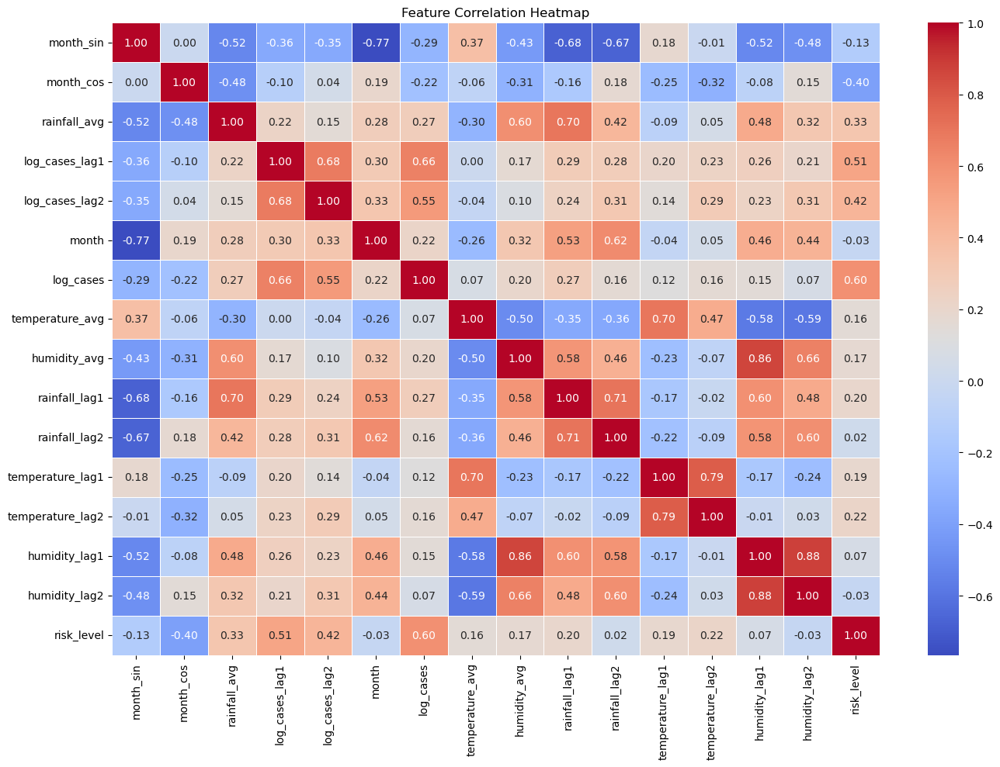

In [250]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Features you want to inspect
features = [
    "month_sin",
   # "cases_pct_change_1m",
   # "cases_rolling_mean_3m",
    "month_cos",
    "rainfall_avg",    
    "log_cases_lag1", 
    "log_cases_lag2",
    "month",
    "log_cases",
    "temperature_avg",
    "humidity_avg",
    "rainfall_lag1",
    "rainfall_lag2",
    "temperature_lag1",
    "temperature_lag2",
    "humidity_lag1",
    "humidity_lag2",
    "risk_level"
]

# Select only available columns
corr_data = monthly[features].copy()

# Convert everything to numeric
for col in corr_data.columns:
    corr_data[col] = pd.to_numeric(corr_data[col], errors="coerce")

# Correlation matrix
corr_matrix = corr_data.corr()

# Show correlation with target only
target_corr = corr_matrix["risk_level"].sort_values(ascending=False)

print("Correlation with risk_level:")
print(target_corr)

# Heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    linewidths=0.5
)

plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.savefig("correlation_heatmap.pdf", format="pdf")
plt.show()


In [157]:
# Select features and target
region_cols = [col for col in monthly.columns if col.startswith("Region_")]

features = [
    "month",
    "rainfall_avg",
    "temperature_avg",
    "humidity_avg",
    "rainfall_lag1",
    "temperature_lag1",
    "humidity_lag1",
    "cases_lag1",
    "rainfall_lag2",
    "temperature_lag2",
    "humidity_lag2",
    "cases_lag2"


] + region_cols

X = monthly[features]
y = monthly["risk_level"]


In [32]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

# Run LazyPredict
clf = LazyClassifier(
    verbose=0,
    ignore_warnings=True,
    custom_metric=None
)

models, predictions = clf.fit(
    X_train,
    X_test,
    y_train,
    y_test
)

# Show model comparison
print(models)

# Save results

                             Accuracy  Balanced Accuracy   ROC AUC  F1 Score  \
Model                                                                          
RandomForestClassifier       0.756098           0.756098  0.889847  0.753077   
LGBMClassifier               0.715447           0.715447  0.875372  0.713916   
AdaBoostClassifier           0.711382           0.711382  0.838043  0.713256   
NuSVC                        0.703252           0.703252       NaN  0.699690   
ExtraTreesClassifier         0.703252           0.703252  0.855245  0.699334   
XGBClassifier                0.691057           0.691057  0.868605  0.687693   
SVC                          0.686992           0.686992       NaN  0.683481   
BaggingClassifier            0.678862           0.678862  0.847177  0.676389   
LogisticRegression           0.674797           0.674797  0.845851  0.667073   
CalibratedClassifierCV       0.650407           0.650407  0.838539  0.630250   
LinearDiscriminantAnalysis   0.650407   

In [ ]:
import joblib

model = joblib.load("cholera_risk_model.pkl")

In [17]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# -----------------------------
# 1. Create regional summary
# -----------------------------

vuln = monthly.groupby("Region").agg({
    "cases": "mean",
    "rainfall_avg": "mean",
    "temperature_avg": "mean",
    "humidity_avg": "mean"
}).reset_index()

vuln = vuln.rename(columns={
    "cases": "historical_burden",
    "rainfall_avg": "avg_rainfall",
    "temperature_avg": "avg_temperature",
    "humidity_avg": "avg_humidity"
})

print(vuln)

       Region  historical_burden  avg_rainfall  avg_temperature  avg_humidity
0    Adamaoua         208.651786      4.483334        22.641853     67.906162
1      Centre         996.149254      4.246565        23.653726     81.514339
2        East         347.008929      3.932104        23.686590     75.809005
3   Far North        1488.666667      2.207760        27.783187     46.573360
4    Littoral        1172.679688      6.646428        26.066883     87.286720
5       North         736.730159      3.016469        27.702436     55.231541
6  North-West         555.821429      5.558909        20.773203     77.780129
7       South         235.829457      4.261066        23.275278     87.531083
8  South-West         904.132812      8.083344        24.318247     88.509002
9        West         502.175000      5.866618        20.980657     80.695639


In [18]:
# -----------------------------
# 2. Normalize variables
# -----------------------------

scaler = MinMaxScaler()

cols_to_scale = [
    "historical_burden",
    "avg_rainfall",
    "avg_temperature",
    "avg_humidity"
]

scaled = scaler.fit_transform(vuln[cols_to_scale])

scaled_df = pd.DataFrame(
    scaled,
    columns=[
        "burden_scaled",
        "rainfall_scaled",
        "temperature_scaled",
        "humidity_scaled"
    ]
)

vuln = pd.concat([vuln, scaled_df], axis=1)

print(vuln)

       Region  historical_burden  avg_rainfall  avg_temperature  avg_humidity  \
0    Adamaoua         208.651786      4.483334        22.641853     67.906162   
1      Centre         996.149254      4.246565        23.653726     81.514339   
2        East         347.008929      3.932104        23.686590     75.809005   
3   Far North        1488.666667      2.207760        27.783187     46.573360   
4    Littoral        1172.679688      6.646428        26.066883     87.286720   
5       North         736.730159      3.016469        27.702436     55.231541   
6  North-West         555.821429      5.558909        20.773203     77.780129   
7       South         235.829457      4.261066        23.275278     87.531083   
8  South-West         904.132812      8.083344        24.318247     88.509002   
9        West         502.175000      5.866618        20.980657     80.695639   

   burden_scaled  rainfall_scaled  temperature_scaled  humidity_scaled  
0       0.000000         0.387293  

In [19]:
# -----------------------------
# 3. Create vulnerability score
# -----------------------------

vuln["vulnerability_score"] = (
    0.40 * vuln["burden_scaled"] +
    0.25 * vuln["rainfall_scaled"] +
    0.20 * vuln["temperature_scaled"] +
    0.15 * vuln["humidity_scaled"]
)

# Convert score to percentage
vuln["vulnerability_score_percent"] = vuln["vulnerability_score"] * 100

In [20]:
# -----------------------------
# 4. Create vulnerability class
# -----------------------------

def classify_vulnerability(score):
    if score < 0.33:
        return "Low Vulnerability"
    elif score < 0.66:
        return "Medium Vulnerability"
    else:
        return "High Vulnerability"

vuln["vulnerability_class"] = vuln["vulnerability_score"].apply(classify_vulnerability)

print(vuln[[
    "Region",
    "historical_burden",
    "avg_rainfall",
    "avg_temperature",
    "avg_humidity",
    "vulnerability_score_percent",
    "vulnerability_class"
]])

       Region  historical_burden  avg_rainfall  avg_temperature  avg_humidity  \
0    Adamaoua         208.651786      4.483334        22.641853     67.906162   
1      Centre         996.149254      4.246565        23.653726     81.514339   
2        East         347.008929      3.932104        23.686590     75.809005   
3   Far North        1488.666667      2.207760        27.783187     46.573360   
4    Littoral        1172.679688      6.646428        26.066883     87.286720   
5       North         736.730159      3.016469        27.702436     55.231541   
6  North-West         555.821429      5.558909        20.773203     77.780129   
7       South         235.829457      4.261066        23.275278     87.531083   
8  South-West         904.132812      8.083344        24.318247     88.509002   
9        West         502.175000      5.866618        20.980657     80.695639   

   vulnerability_score_percent   vulnerability_class  
0                    22.644276     Low Vulnerability 

In [21]:
# -----------------------------
# 5. Sort regions by vulnerability
# -----------------------------

vuln_ranked = vuln.sort_values(
    "vulnerability_score_percent",
    ascending=False
)

print(vuln_ranked[[
    "Region",
    "vulnerability_score_percent",
    "vulnerability_class"
]])

       Region  vulnerability_score_percent   vulnerability_class
4    Littoral                    78.677650    High Vulnerability
8  South-West                    71.847801    High Vulnerability
3   Far North                    60.000000  Medium Vulnerability
1      Centre                    54.000328  Medium Vulnerability
5       North                    42.809794  Medium Vulnerability
9        West                    37.537668  Medium Vulnerability
6  North-West                    36.270092  Medium Vulnerability
7       South                    31.374704     Low Vulnerability
2        East                    30.429947     Low Vulnerability
0    Adamaoua                    22.644276     Low Vulnerability


In [22]:
# -----------------------------
# 6. Save vulnerability result
# -----------------------------

vuln_ranked.to_csv(
    "cameroon_cholera_vulnerability_index.csv",
    index=False
)

C:\Users\Yangsi\AppData\Local\Temp\ipykernel_28548\1504822.py:24: DeprecationWarning: *choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.choropleth_mapbox(


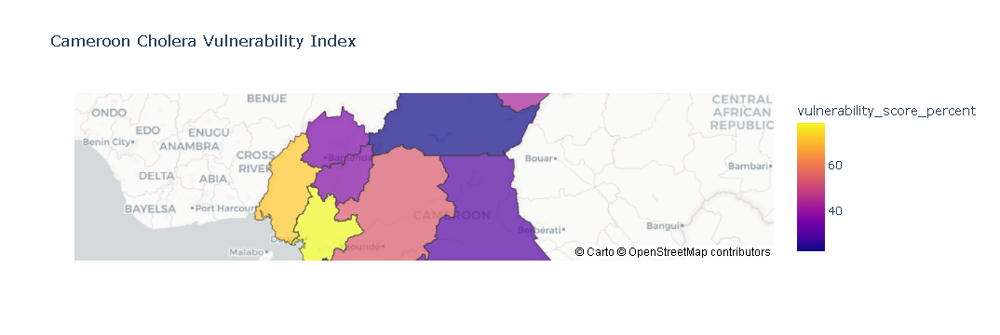

In [24]:
import geopandas as gpd
import plotly.express as px

dfg = gpd.read_file("cmr_admin1.geojson")

regions_geo = dfg.dissolve(
    by="adm1_name",
    as_index=False
)

# Fix names if needed
vuln_ranked["Region"] = vuln_ranked["Region"].replace({
    "Adamaoua": "Adamawa",
    "Far North": "Far-North"
})

vuln_map = regions_geo.merge(
    vuln_ranked,
    left_on="adm1_name",
    right_on="Region",
    how="left"
)

fig = px.choropleth_mapbox(
    vuln_map,
    geojson=vuln_map.geometry.__geo_interface__,
    locations=vuln_map.index,
    color="vulnerability_score_percent",
    hover_name="adm1_name",
    hover_data=[
        "historical_burden",
        "avg_rainfall",
        "avg_temperature",
        "avg_humidity",
        "vulnerability_class"
    ],
    mapbox_style="carto-positron",
    center={"lat": 5.5, "lon": 12.5},
    zoom=5,
    opacity=0.7,
    title="Cameroon Cholera Vulnerability Index"
)

fig.show()

In [28]:
pip install pysheds


   -------------------------- ------------- 2/3 [pysheds]
   ---------------------------------------- 3/3 [pysheds]

Note: you may need to restart the kernel to use updated packages.


In [29]:
# ============================================================
# 2. IMPORT LIBRARIES
# ============================================================

import pandas as pd
import numpy as np
import geopandas as gpd
import rasterio
from rasterio.mask import mask

# PySheds for hydrological/terrain analysis
from pysheds.grid import Grid

# Machine learning + preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from xgboost import XGBClassifier


In [30]:
# ============================================================
# 3. LOAD CAMEROON ADMIN BOUNDARIES
# ============================================================

dfg = gpd.read_file("cmr_admin1.geojson")

# Your GeoJSON is ADM2 level, so dissolve to ADM1 regions
regions = dfg.dissolve(by="adm1_name", as_index=False)

regions = regions[["adm1_name", "geometry"]]

# Keep CRS as WGS84
regions = regions.to_crs("EPSG:4326")

print(regions[["adm1_name"]])
print(regions.shape)

    adm1_name
0     Adamawa
1      Centre
2        East
3   Far-North
4    Littoral
5       North
6  North-West
7       South
8  South-West
9        West
(10, 2)


In [31]:
# ============================================================
# 4. LOAD SRTM ELEVATION FOR CAMEROON
# ============================================================

from pysheds.grid import Grid

# Path to your downloaded DEM file (SRTM GeoTIFF for Cameroon)
# You can get SRTM data from sources like USGS EarthExplorer or NASA Earthdata
dem_path = "cameroon_srtm.tif"

# Load DEM into PySheds
grid = Grid.from_raster(dem_path, data_name='dem')

# Inspect DEM
print("DEM shape:", grid.dem.shape)
print("DEM resolution:", grid.res)


NameError: name 'elevation' is not defined